<a href="https://colab.research.google.com/github/vaibhavmande131198/Supervised-learning/blob/main/Supervised_Learning_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -



##### **Project Type**    - Regression
##### **Contribution**    - Individual


# **Project Summary -**



This project focuses on predicting the hourly demand for rental bikes in urban areas to ensure a stable and efficient supply, thereby reducing user wait times and enhancing the bike-sharing experience. By conducting exploratory data analysis (EDA) to understand patterns and relationships in the data, and employing various regression algorithms such as linear regression, ridge regression, lasso regression, and elastic net regression, we aim to accurately forecast bike demand.

# **GitHub Link -**

https://github.com/vaibhavmande131198/Supervised-learning

# **Problem Statement**


In the evolving landscape of urban mobility, companies like Yulu Bike are at the forefront of providing efficient and eco-friendly transportation solutions. Accurate prediction of bike-sharing demand is crucial for optimizing fleet management, enhancing customer satisfaction, and maximizing operational efficiency. By analyzing data related to bike-sharing demand, Yulu Bike aims to gain a deeper understanding of the factors influencing bike rentals. The dataset includes a range of variables such as weather conditions, time of day, and special events, which impact bike usage patterns

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [2]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

### Dataset Loading

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# save the File_path
file_path = '/content/drive/MyDrive/Colab Notebooks/Almabetter data science/Machine learning /ML Projects/Supervised Learning : Regression Project/SeoulBikeData.csv'

In [5]:
# Load Dataset
df = pd.read_csv(file_path,encoding="ISO-8859-1")

### Dataset First View

In [6]:
# Dataset First Look
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [7]:
# Dataset Rows & Columns count
df.shape

(8760, 14)

### Dataset Information

In [8]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [9]:
# Dataset Duplicate Value Count
df.duplicated().sum()

0

#### Missing Values/Null Values

In [10]:
# Missing Values/Null Values Count
df.isnull().sum()

,0
Date,0
Rented Bike Count,0
Hour,0
Temperature(°C),0
Humidity(%),0
Wind speed (m/s),0
Visibility (10m),0
Dew point temperature(°C),0
Solar Radiation (MJ/m2),0
Rainfall(mm),0


In [11]:
# Visualizing the missing values
df.isnull()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8756,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8757,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8758,False,False,False,False,False,False,False,False,False,False,False,False,False,False


### What did you know about your dataset?

1. The Seoul Bike Sharing Demand dataset offers information on Rented Bike Demand from 2017 to 2018.

2. The provided dataset has 14 characteristics and 8760 observations.

 out of which there thre are 10 numerical ['Rented_Bike_Count', 'Hour', 'Temperature(°C)', 'Humidity', 'Wind_speed', 'Visibility ', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall' ]

 and 4 categorial feature ['Date', 'Seasons', 'Holiday', 'Functioning_Day']

 However, date has data type of object which should be further treated to have correct data type and as per data description hour represents timestamp.


3. There are no duplicates or missing values in the dataset.



## ***2. Understanding Your Variables***

In [12]:
# Dataset Columns
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [13]:
#stores the name of columns in the list
column_list = df.columns.to_list()
print(column_list)

['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day']


In [14]:
# Dataset Describe
df.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


### Variables Description

**Date**: Date on which bike rented.

**Rented Bike Count** : Count of Bike Rented.

**Hour** : Hour of the day (0-23).

**Temperature** : Temprature of the day in celcius.

**Humidity** : Humidity of the day in percentage.

**Wind Speed** : Speed of wind in m/s.

**Visibility** : Visibility Measure 10m.

**Dew Point Temprature** : Dew Point Temprature measure in degree celcius.

**Solar radiation** : Solar radiation measure in MJ/m2.

**Rainfall** : Rainfall in mm.

**Snowfall** : Snowfall measure in cm.

**Seasons** : Spring, Summer, Fall, Winter.

**Holidays** : Holiday / No Holiday

**Functional** : Functional Day / No functional Day

### Check Unique Values for each variable.

In [15]:
# Check Unique Values for each variable.
# Example : df['Seasons'].value_counts().count()   ----> it will give us the total number of unique values in the season column
''' mothood 1:
df.nunique()'''

#Method 2:
for i in df.columns:
  print(f'{i} : {df[i].value_counts().count()}')


Date : 365
Rented Bike Count : 2166
Hour : 24
Temperature(°C) : 546
Humidity(%) : 90
Wind speed (m/s) : 65
Visibility (10m) : 1789
Dew point temperature(°C) : 556
Solar Radiation (MJ/m2) : 345
Rainfall(mm) : 61
Snowfall (cm) : 51
Seasons : 4
Holiday : 2
Functioning Day : 2


## 3. ***Data Wrangling***

### Data Wrangling Code

In [16]:
# Write your code to make your dataset analysis ready.
#creating copy to keep oringal data safe
new_df = df.copy()

In [17]:
#basic checks of the copied dataset
print(f'shape : {new_df.shape}')
print(f'Null_count: {new_df.isnull().sum()}')
print(f'duplicate_count: {new_df.duplicated().sum()}')
print(f'columns: {new_df.columns.to_list()}')
print(f'info: {new_df.info()}')

shape : (8760, 14)
Null_count: Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64
duplicate_count: 0
columns: ['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8

In [18]:
new_df.head(1)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes


From the preceding fundamental checks, we can see that date has an object datatype that has to be converted into date.

In [19]:
# converting the date column into date datatype
new_df['Date'] = pd.to_datetime(new_df['Date'], format='%d/%m/%Y')

In [20]:
#Checking the datatype of date column changed or not
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object        
 12  Holida

We have successfully changed the datatype of date column from object to datetime

In [21]:
new_df.head(2)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [22]:
#Extracting day, month and year from the date column for further analysis
#Extracting month from date column
import calendar
new_df['month'] = pd.DatetimeIndex(new_df['Date']).month
new_df['month'] = new_df['month'].apply(lambda x: calendar.month_abbr[x])

#Extracting day name from date
new_df['day'] = new_df['Date'].dt.day_name()

#Extracting year
new_df['year'] = new_df['Date'].dt.year

In [23]:
#Drop date column which is not needed now
new_df.drop( 'Date', axis = 1, inplace = True)

In [24]:
#convert a year column as categorical
new_df['year'] = new_df['year'].astype('object')

In [25]:
# Define the function to categorize hours
def categorize_time_of_day(hour):
    if 12 <= hour < 17:
        return 'afternoon'
    elif 17 <= hour < 21:
        return 'evening'
    elif hour >= 21 or hour < 4:
        return 'night'
    else:
        return 'morning'

# Apply the function to create a new column
new_df['Time_of_Day'] = new_df['Hour'].apply(categorize_time_of_day)

In [26]:
#define weekend and weekday based on the days
def categorize_day(day):
    if day in ['Saturday', 'Sunday']:
        return 'weekend'

    else:
        return 'weekday'

# Apply the function to create a new column
new_df['Day_Type'] = new_df['day'].apply(categorize_day)

In [27]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  month                      8760 non-null   objec

In [28]:
#check the day month and year column
new_df.head(2)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,month,day,year,Time_of_Day,Day_Type
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,night,weekday
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Dec,Friday,2017,night,weekday


In [29]:
#Store the numerical and categorical features for univariate , bivariate and multivariate analysis
numerical_features = new_df.select_dtypes(exclude='object').columns
categorical_features = new_df.select_dtypes(include='object').columns

In [30]:
print(numerical_features)

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')


In [31]:
print(categorical_features)

Index(['Seasons', 'Holiday', 'Functioning Day', 'month', 'day', 'year',
       'Time_of_Day', 'Day_Type'],
      dtype='object')


### What all manipulations have you done and insights you found?



The dataset has no null or duplicate values, therefore there is no need to worry about them.

We completed the following data wrangling tasks:

1. Convert the date column to datetime datatype.

2. Extract the day, month, and year from the date column.

3. Remove the date column.

4. Convert the year column into a category column

5. Divide the hours to get the time of day in the morning, afternoon, evening, and night.

6. Divide the days into weekdays and weekends.

7. Store all of the dataframe's numerical and categorical columns for further analysis, such as univariate, bivariate, and multivariate analysis.




## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

##Basic Visualization to gain some insights from the data

### Chart - 1  :  Monthly Bike Demand


In [32]:
# average demand of bikes per month
monthly_bike_demand = new_df.groupby('month')['Rented Bike Count'].mean().sort_values(ascending = False)
print(monthly_bike_demand)

month
Jun    1245.676389
Jul     987.177419
May     950.387097
Sep     935.572222
Aug     876.192204
Oct     874.563172
Apr     728.093056
Nov     646.826389
Mar     511.551075
Dec     249.099462
Feb     225.941964
Jan     201.620968
Name: Rented Bike Count, dtype: float64


<ipython-input-33-5f911355269f>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=monthly_bike_demand.index, y=monthly_bike_demand.values  , palette='mako')


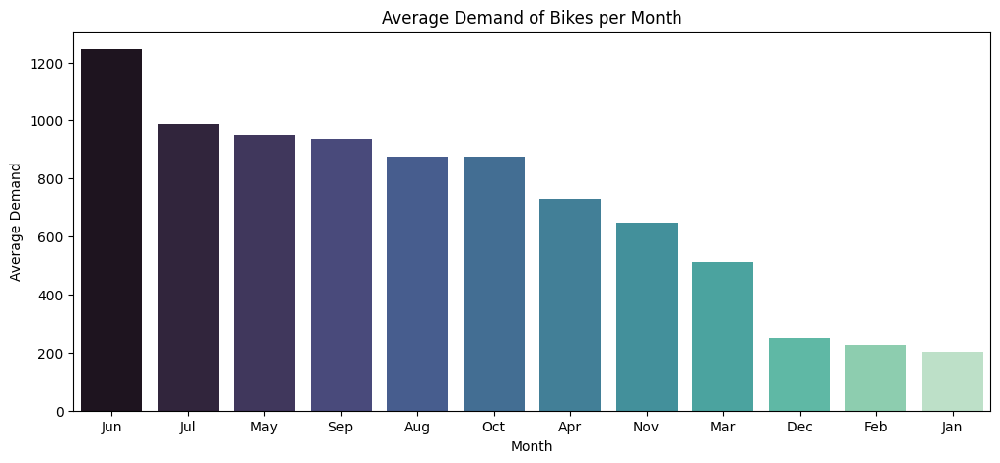

In [33]:
# Visualization code
plt.figure(figsize=(12,5))
sns.barplot(x=monthly_bike_demand.index, y=monthly_bike_demand.values  , palette='mako')
plt.title('Average Demand of Bikes per Month')
plt.xlabel('Month')
plt.ylabel('Average Demand')
plt.show()

##### 1. Why did you pick the specific chart?

When comparing a big set of categorical data, bar graphs work well. In this case, we display a graph for each month to learn more about the demand for bikes.

##### 2. What is/are the insight(s) found from the chart?

The demand for bikes is extremely high in June, and it is extremely low at the beginning of the year.

We can see that throughout the winter months of December, January, and February, there is a low demand for bikes

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the business may maximise revenue and meet demand by optimising pricing, operations, and resources by analysing the demand trend across several months. For instance, the business can boost the quantity of bikes accessible and modify pricing policies to optimise profits during the busiest months (May, June, and July). Additionally, the business can lower the quantity of bikes available and run sales or discounts to draw clients during the months of December, January, and February when demand is low.

#### Chart - 2 : Seasonal Bikes Demand

In [34]:
# Average demand of bike by seasons
seasonal_bike_demand = new_df.groupby('Seasons')['Rented Bike Count'].mean().sort_values(ascending = False)
print(seasonal_bike_demand)

Seasons
Summer    1034.073370
Autumn     819.597985
Spring     730.031250
Winter     225.541204
Name: Rented Bike Count, dtype: float64


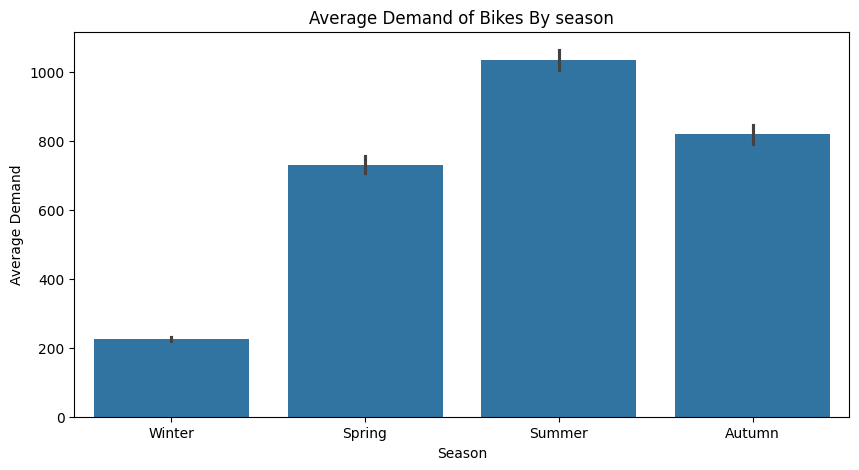

In [35]:
# Plot a graph for each season and gain some insights about the Bike demand for each season

plt.figure(figsize=(10,5))
sns.barplot(x='Seasons',y='Rented Bike Count',data = new_df )
plt.title('Average Demand of Bikes By season')
plt.xlabel('Season')
plt.ylabel('Average Demand')
plt.show()

##### 1. Why did you pick the specific chart?


When comparing a wide set of categorical variables, bar graphs work well. In this case, we display a graph for each season to learn more about the demand for bikes in each of those seasons.

##### 2. What is/are the insight(s) found from the chart?

The demand for bike rentals is greatest during the summer and lowest during the winter. as we have had the identical plot in December, January, and February.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The bike sharing company can use this information to better manage its operations by limiting the number of bikes available during the off-season and raising the number during the peak season.

#### Chart - 3 : Rented Bike count by Each phase of day acorss seasons

In [36]:
# Bike demand according to time of day
phase_bike_demand = new_df.groupby('Time_of_Day')['Rented Bike Count'].mean().sort_values(ascending = False)
print(phase_bike_demand)

Time_of_Day
evening      1226.386986
afternoon     790.264110
night         585.425440
morning       494.450342
Name: Rented Bike Count, dtype: float64


In [37]:
# Bike demand across Season and time of day
seasonal_demand_per_phase = new_df.groupby(['Seasons', 'Time_of_Day'])['Rented Bike Count'].mean()
print(seasonal_demand_per_phase)

Seasons  Time_of_Day
Autumn   afternoon       969.516484
         evening        1420.500000
         morning         576.785714
         night           646.640502
Spring   afternoon       927.502174
         evening        1297.543478
         morning         495.983696
         night           532.170807
Summer   afternoon       968.945652
         evening        1838.152174
         morning         712.290761
         night           988.871118
Winter   afternoon       286.080000
         evening         332.019444
         morning         186.951389
         night           165.557143
Name: Rented Bike Count, dtype: float64


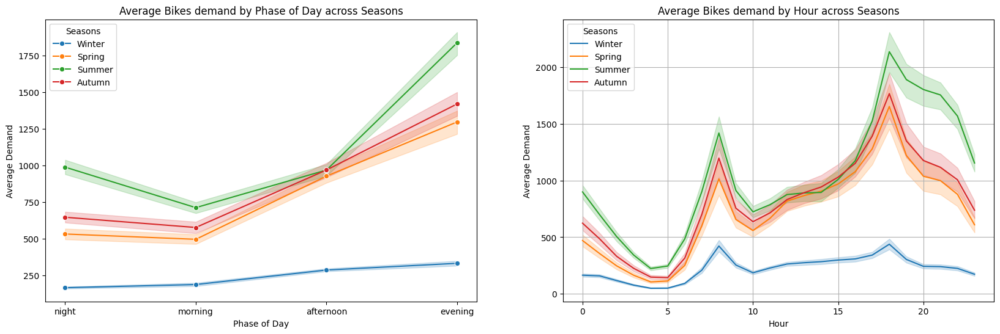

In [38]:
# visualization code
plt.figure(figsize=(20, 6))
plt.subplot(1,2,1)
sns.lineplot(x='Time_of_Day', y='Rented Bike Count', data=new_df, color = 'red',marker='o', hue="Seasons")
plt.title('Average Bikes demand by Phase of Day across Seasons')
plt.xlabel('Phase of Day')
plt.ylabel('Average Demand')
plt.subplot(1,2,2)
sns.lineplot(x ='Hour' , y='Rented Bike Count' ,  data=new_df, color = 'red', hue="Seasons")
plt.title('Average Bikes demand by Hour across Seasons')
plt.xlabel('Hour')
plt.ylabel('Average Demand')
plt.grid(True)
plt.show()


##### 1. Why did you pick the specific chart?

Line charts are particularly effective for visualizing data that changes over time or across a continuous variable. Here we have created a categorical feature based on hours of the day so we can either plot bar graph or line chart.
basically, Line charts are a useful tool for visualizing trends over time. It allows us in easy identification of patterns and changes over time


##### 2. What is/are the insight(s) found from the chart?

The demand is higher in the morning,afternoon and evening time as people go to offices/schools and come back in evening/afternoon. Demand is very low in the night time.

we can also see that the demand is very low in winter season

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, company can manage the resources better in the morning to evening based on the above graph.

#### Chart - 4 :  Demand of bike over weekend and weekdays

In [39]:
weekend_weekday_demand = new_df.groupby('Day_Type')['Rented Bike Count'].mean().sort_values(ascending = False)
print(weekend_weekday_demand)

Day_Type
weekday    719.448914
weekend    667.342147
Name: Rented Bike Count, dtype: float64


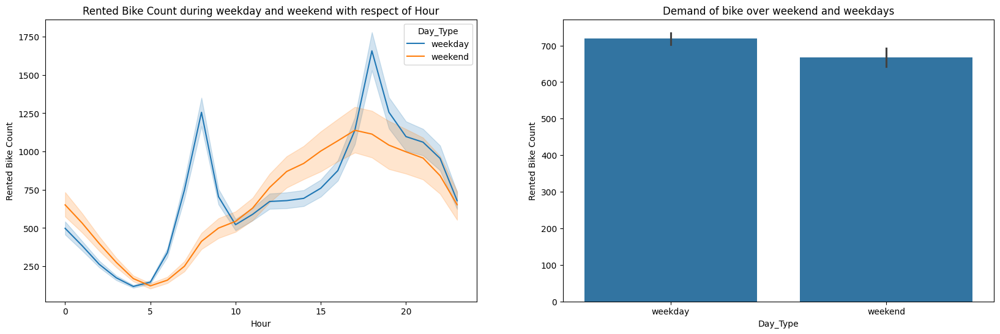

In [40]:
# visualization code
plt.figure(figsize = (20,6))
plt.subplot(1,2,1)
sns.lineplot(x=new_df["Hour"],y=new_df['Rented Bike Count'],hue=new_df['Day_Type'])
plt.title("Rented Bike Count during weekday and weekend with respect of Hour")
plt.subplot(1,2,2)
sns.barplot(x = 'Day_Type' , y = 'Rented Bike Count' , data = new_df)
plt.title('Demand of bike over weekend and weekdays')
plt.xlabel('Day_Type')
plt.ylabel('Rented Bike Count')
plt.show()

##### 1. Why did you pick the specific chart?

I've plotted a line chart, which is the most appropriate way to display the demand trend over time, in order to compare the demand for bikes by hour as well as on weekends and weekdays.

The best way to compare numerical values across categorical features is via a bar graph. This is the rationale behind my bar graph plot.


##### 2. What is/are the insight(s) found from the chart?

We can observe that the demand for bikes is nearly the same on weekends as it is throughout the week.

Additionally, we can observe that demand is higher during specific time periods on weekdays.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Since the demand for bikes is nearly the same on weekends as it is on weekdays, the company must employ the same strategy for both. They must assign people to work shifts on weekends and keep the same supply of bikes available throughout the weekend.


#### Chart - 5 : Effect of temperature , dew point temperature on the demand of bike

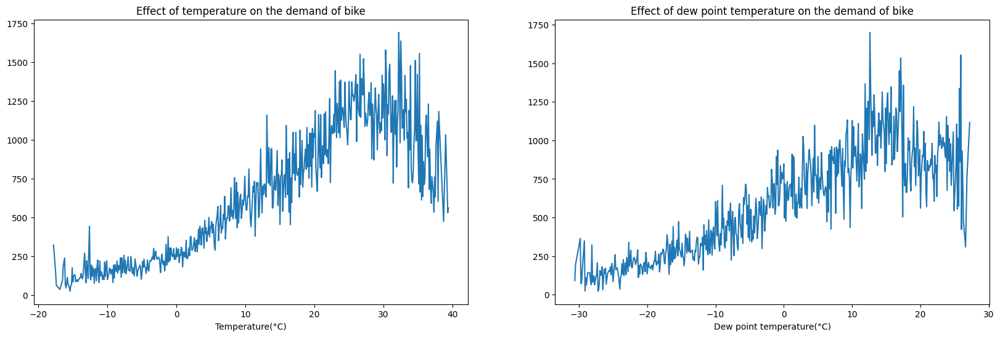

In [41]:
# Chart - 5 visualization code
plt.figure(figsize = (20,6))
plt.subplot(1,2,1)
df.groupby('Temperature(°C)')['Rented Bike Count'].mean().plot(kind='line')
plt.title('Effect of temperature on the demand of bike')
plt.subplot(1,2,2)
df.groupby('Dew point temperature(°C)')['Rented Bike Count'].mean().plot(kind='line')
plt.title('Effect of dew point temperature on the demand of bike')
plt.show()

##### 1. Why did you pick the specific chart?

To see the effect of temperature, dew point temperature I have used line chart and to see the trend of bike demand according to features.

##### 2. What is/are the insight(s) found from the chart?

We may conclude that, based on historical data, temperature and due point temperature are important factors in predicting bike demand.

The strong association between them is evident.

At low temperatures, demand is lower, and as temperatures rise, demand continues to rise. Due to extreme heat, we can observe that the demand trend shifts downward after a particular temperature. This also applies to the temperature of the dew point.





#### Chart - 6 : Effect of Rainfall and Snowfall on Bike demand

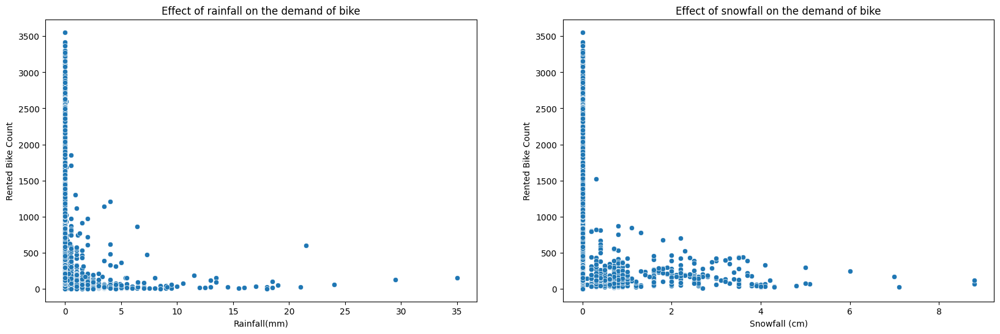

In [42]:
#Visualization code
plt.figure(figsize = (20,6))
plt.subplot(1,2,1)
sns.scatterplot(x = 'Rainfall(mm)' , y = 'Rented Bike Count' , data = new_df)
plt.title('Effect of rainfall on the demand of bike')
plt.subplot(1,2,2)
sns.scatterplot(x = 'Snowfall (cm)' , y = 'Rented Bike Count' , data = new_df)
plt.title('Effect of snowfall on the demand of bike')
plt.show()

##### 1. Why did you pick the specific chart?

A scatter plot uses dots to represent values for two different numeric variables. The position of each dot on the horizontal and vertical axis indicates values for an individual data point. Scatter plots are used to observe relationships between variables.

Thus, I have used the scatter plot to depict the relationship between Rented Bike Count and Rainfall as well as Snowfall.

##### 2. What is/are the insight(s) found from the chart?

There is huge effect of both rainfall and snowfall on bike demand. Most Rentals Bikes are rented mostly when there is no rainfall and snowfall. As Rainfall and snowfall increases demand decreases

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Although we can't control Rainfall or Snowfall but by understanding the demand trend over snowfall and rainfall, the company can adjust its operations to better meet customer needs attractiveness maybe by offer promotions or discounts.

#Univariate Analysis :

In [43]:
#Descriptive statstics
new_df.describe().T   # .T is used to transpose the dataframe

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.602055,644.997468,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.500000,6.922582,0.0,5.75,11.50,17.25,23.00
Temperature(°C),8760.0,12.882922,11.944825,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.226256,20.362413,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.724909,1.036300,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.825799,608.298712,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(°C),8760.0,4.073813,13.060369,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.569111,0.868746,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.148687,1.128193,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.075068,0.436746,0.0,0.00,0.00,0.00,8.80


We can see the count of row,mean,median,standard deviation, minimum value, maximum value of each numerical column.


Insights :
When describing a numerical column in a dataset, various insights can be derived from the output, particularly regarding the distribution, central tendency, and variability of the data. This analysis can also help identify outliers and missing information.

1.Count measures the number of non-null entries in the column. indicated that there is no null values in the column.

2.The average value, providing a measure of central tendency.

3.The middle value when the data is sorted, which is less affected by outliers than the mean.

4.Standard Deviation: Indicates the amount of variation or dispersion in the values.

5.By examining the minimum and maximum values along with standard deviation or mean value we can identify potential outliers

Example:-
1. for the rainfall and snowfall we can observe that the there is huge differance between mean and maximum value indicates that there is a outliers and probably the skewness in the data

6.when mean and median values are nearly equal then we can say that the feature is normally distributed.

Example :-
1. for dew point temperature, humidity we can clearly see that mean is nearly equal to 50 percent, we can say that this features are normally distributed.



#### Chart - 7 : Distribution of Target Variable

<ipython-input-44-f58f42c8ba51>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(new_df['Rented Bike Count'] )    #distplot is combination of histogram and kde(density) plot. the smooth curve in the plot is called KDE


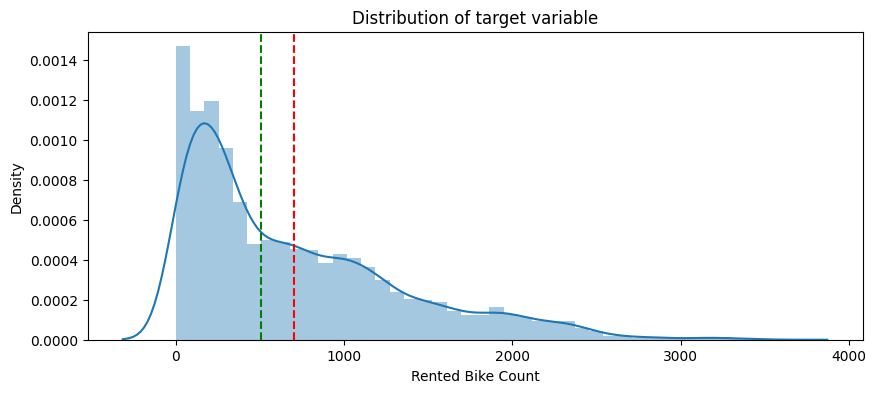

In [44]:
#Distribution of dependent variable
plt.figure(figsize = (10,4))
sns.distplot(new_df['Rented Bike Count'] )    #distplot is combination of histogram and kde(density) plot. the smooth curve in the plot is called KDE
plt.title('Distribution of target variable')
plt.axvline(new_df['Rented Bike Count'].mean(), color='red', linestyle='dashed', linewidth=1.5)
plt.axvline(new_df['Rented Bike Count'].median(), color='green', linestyle='dashed', linewidth=1.5)
plt.show()

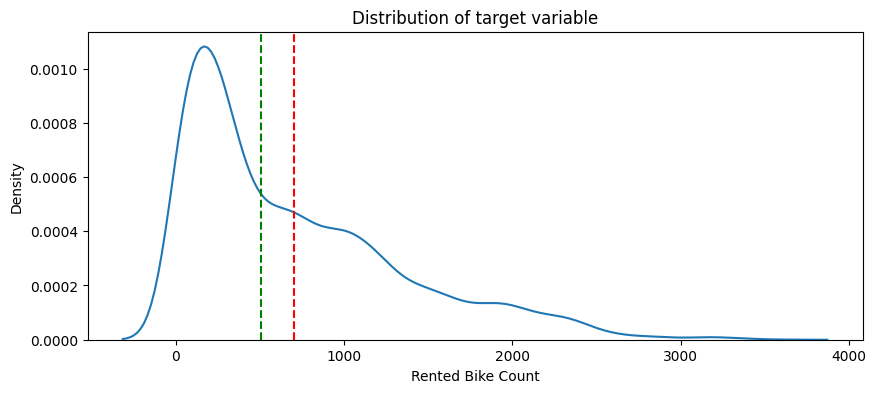

In [45]:
plt.figure(figsize = (10,4))
sns.kdeplot(new_df['Rented Bike Count'])
plt.title('Distribution of target variable')
plt.axvline(new_df['Rented Bike Count'].mean(), color='red', linestyle='dashed', linewidth=1.5)
plt.axvline(new_df['Rented Bike Count'].median(), color='green', linestyle='dashed', linewidth=1.5)
plt.show()

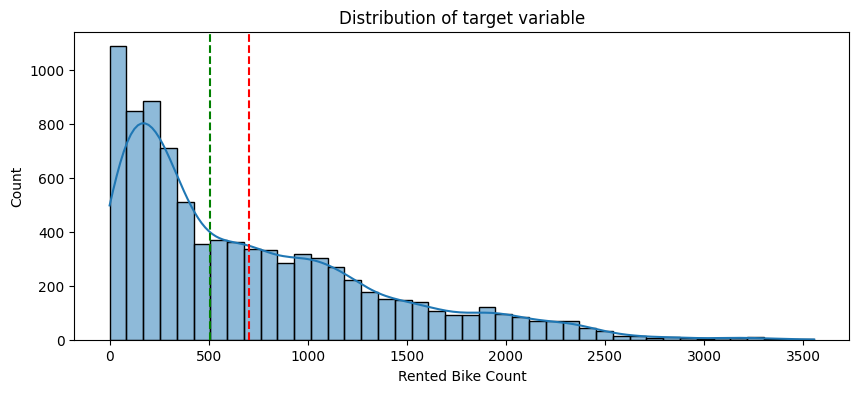

In [46]:
plt.figure(figsize = (10,4))
sns.histplot(new_df['Rented Bike Count'], kde=True)
plt.title('Distribution of target variable')
plt.axvline(new_df['Rented Bike Count'].mean(), color='red', linestyle='dashed', linewidth=1.5)
plt.axvline(new_df['Rented Bike Count'].median(), color='green', linestyle='dashed', linewidth=1.5)
plt.show()

##### 1. Why did you pick the specific chart?

the distribution plot or histogram is used to analyze the distribution of dependent variable(rented bike count). Here we have plot distribution plot to analyze the distribution of target variable,

##### 2. What is/are the insight(s) found from the chart?

Distribution of target varibale is positive skewed where mean being greater than the median  as there are some higher values (Outliers) influencing the average significantly there is a outliers present in the data.

mean > median > mode

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

1.Skewness indicates that there is a outliers in the target variable and need to remove the outliers

2.Another we can make the distribution of target variable near to normal by using transformation (square root transformation , cube root transformation, log transformation etc). the transformation will convert the values of target variable in same scale which will improve the model accuracy

#### Chart - 8 : Visualize outliers in the Target Variable

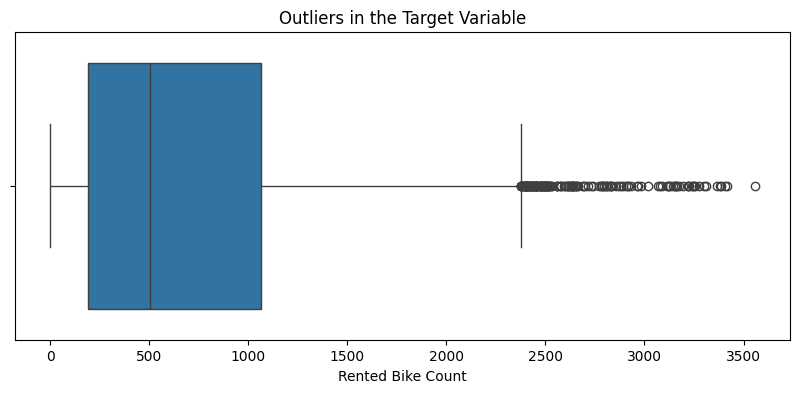

In [47]:
# Outliers in the target variable
plt.figure(figsize = (10,4))
sns.boxplot(x= new_df['Rented Bike Count'])
plt.title('Outliers in the Target Variable')
plt.show()

##### 1. Why did you pick the specific chart?

Box plot is best suited to detect the outliers in the feature.

##### 2. What is/are the insight(s) found from the chart?

Box plot confirms that there is a outliers in the target variable.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 We Needs to be remove outliers from the target variable to improve model performance or need to transform the target variable.

Addressing positive skewness through appropriate transformations and carefully considering outlier management are crucial steps in preparing your target variable for effective modeling.

#### Chart - 9 : Distribution of independent Numerical features

In [48]:
numerical_features

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')

In [49]:
independent_numerical_features = numerical_features.drop('Rented Bike Count')
print(independent_numerical_features)

Index(['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')


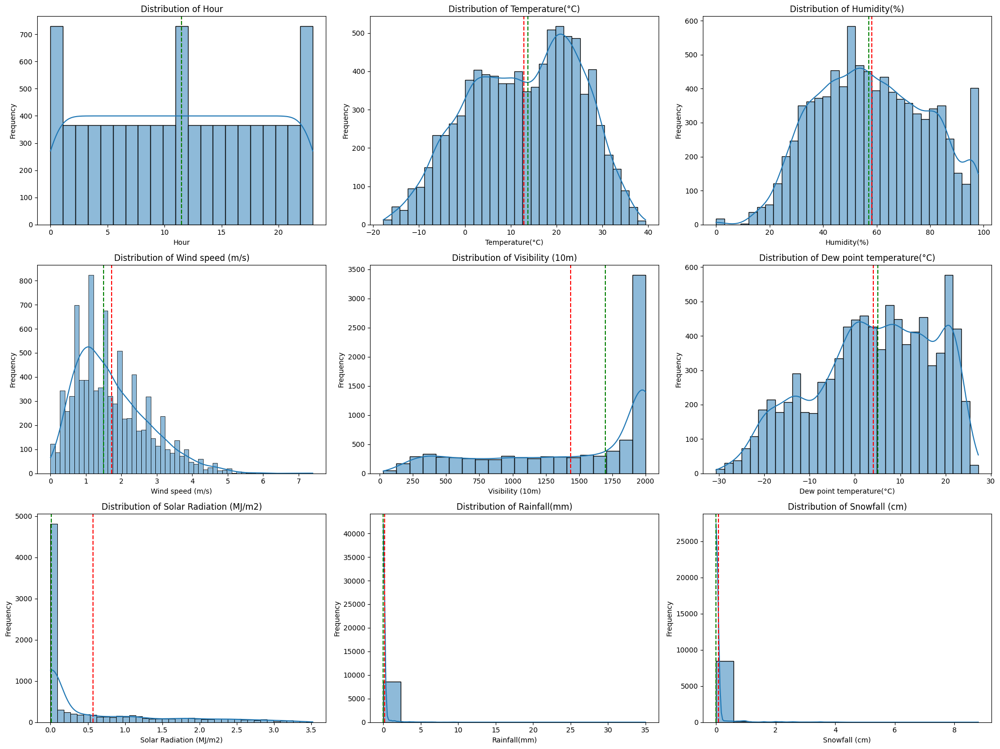

In [50]:
# Distribution of independent numerical features
plt.figure(figsize = (20,15))
for n , col in enumerate(independent_numerical_features):
  plt.subplot(3,3,n+1)
  sns.histplot(new_df[col], kde=True)
  plt.title(f'Distribution of {col}')
  plt.xlabel(col)
  plt.ylabel('Frequency')
  plt.axvline(new_df[col].mean() , color='red', linestyle='dashed', linewidth=1.5)
  plt.axvline(new_df[col].median() , color='green', linestyle='dashed', linewidth=1.5)
plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

Histogram is useful for visualizing the distribution of numerical data.
Analysts can identify patterns or trends within the data, such as skewness or kurtosis, which can inform further analysis

##### 2. What is/are the insight(s) found from the chart?

we can see that temperature, humidity and dew point temperature is almost normally distributed. Other features such as Hour , visibility , wind speed, snowfall, rainfall and solar radiation needs to transform as they are not normally distributed.



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Analysts can identify patterns or trends within the data, such as skewness or kurtosis, which can inform further analysis

We can use this information to transform certain features so that we can train more robust and ccurate model wihch will help in demand prediction.

#### Chart - 10 : Visualizing outliers in the independent numerical variables

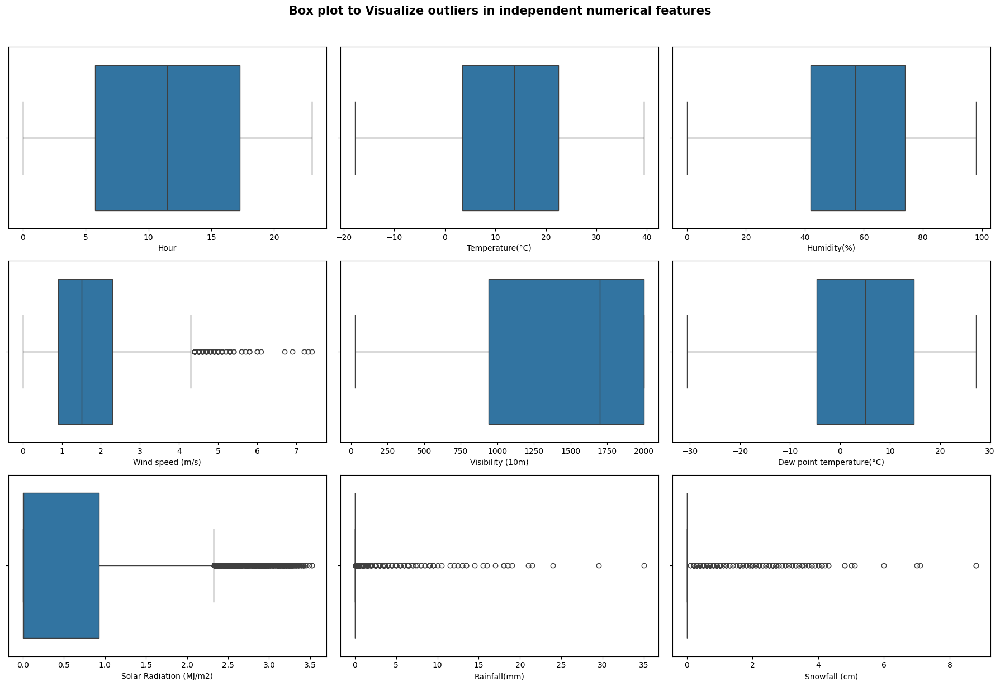

In [51]:
# box plot to analyze the outliers in the features
plt.figure(figsize = (18,12))
plt.suptitle('Box plot to Visualize outliers in independent numerical features', fontsize=15, fontweight='bold', y=1.02 )
for n , col in enumerate(independent_numerical_features):
  plt.subplot(3,3,n+1)
  sns.boxplot(x= new_df[col])
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

I used box plot to analyse the outliers and interquartile range including mean, median, maximum and minimum value of different continuous features.

##### 2. What is/are the insight(s) found from the chart?

Some features such as wind speed, solar radiation , snowfall, raifall contains outliers



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, Outliers can significantly affect statistical analyses and model performance by removing the outliers we can improve predictive accuaracy of our model.

#Bivariate analysis

#### Chart - 12 : regression plot of numerical features (Independent numerical to dependent variable)

In [52]:
numerical_features

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')

In [53]:
independent_numerical_features

Index(['Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
       'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')

In [54]:
target_variable = 'Rented Bike Count'

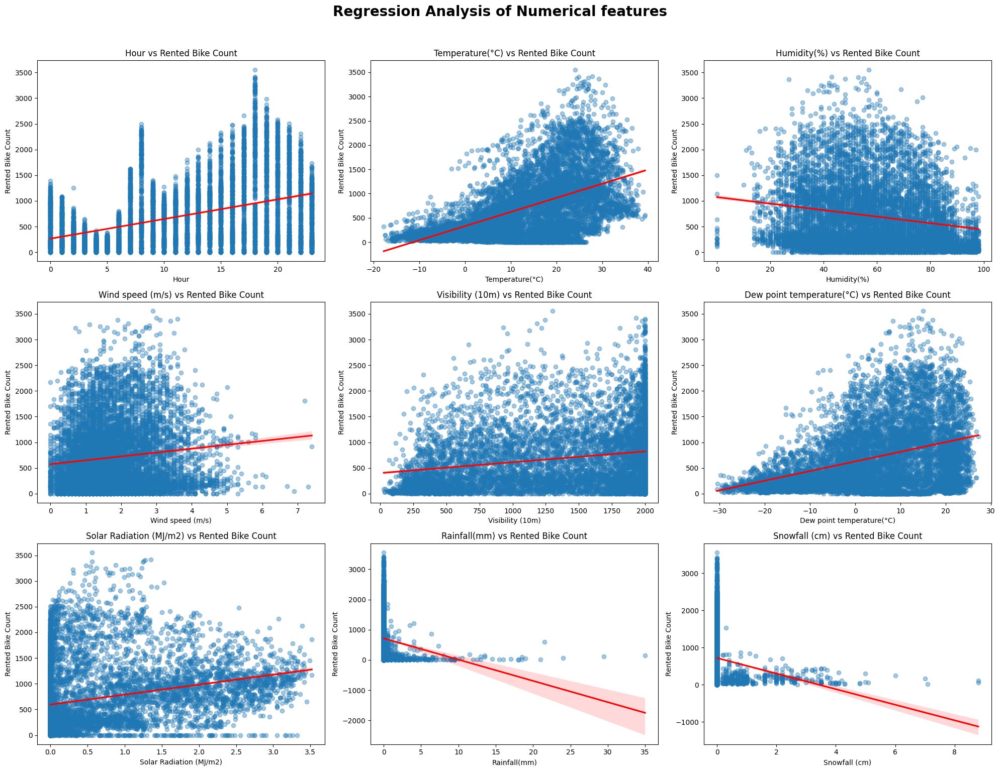

In [55]:
# regression plot of numerical features with target variable
plt.figure(figsize = (20,15))
plt.suptitle('Regression Analysis of Numerical features', fontsize=20, fontweight='bold', y=1.02)
for n , col in enumerate(independent_numerical_features):
  plt.subplot(3,3,n+1)
  sns.regplot(x=new_df[col],y=new_df["Rented Bike Count"],scatter_kws={"alpha": 0.4} , line_kws={"color": "red"})
  plt.title(f'{col} vs {target_variable}')
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Regression plots / scatter plot are both essential tools for visualizing relationships between variables, particularly in the context of linear regression analysis.

The main goal of a regression plot is to understand how changes in the independent variable affect the dependent variable. This is a key aspect of bivariate analysis, which focuses on examining the interactions between two variables

##### 2. What is/are the insight(s) found from the chart?

This regression plots shows that some of our features are positive linear and some are negative linear in relation to our target variable

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By fitting a regression line to data, businesses can predict future outcomes based on historical trends.


#### Chart - 13 : Box plot to detect outliers of target variable across categorical features

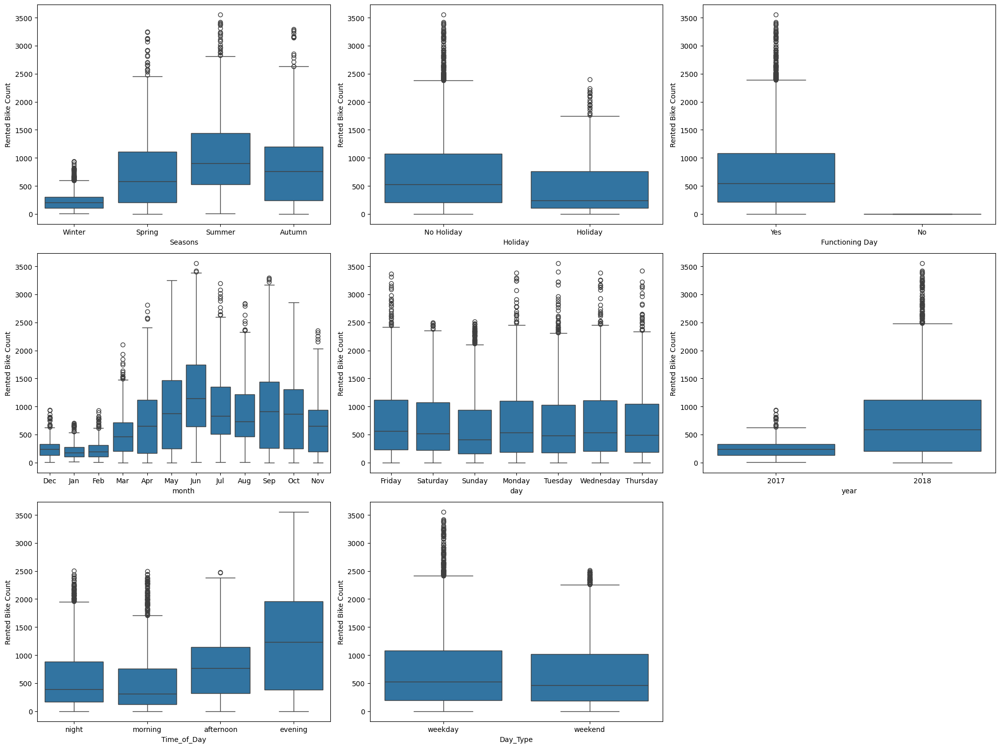

In [56]:
#ploting Box plot to visualize and trying to get information from plot
plt.figure(figsize=(20,15))
for n, col in enumerate(categorical_features):
  plt.subplot(3,3,n+1)
  sns.boxplot(x=new_df[col],y=new_df["Rented Bike Count"])
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

Effective for comparing the dependent variable across different categories defined by an independent categorical variable.

##### 2. What is/are the insight(s) found from the chart?

We can see there are outliers in almost every subcategory of categorical features.

##Check correlation



In [57]:
# Correlation of independent numerical features with target variable
new_df.corr(numeric_only=True)['Rented Bike Count'] # Adding numeric_only=True to only include numerical features

,Rented Bike Count
Rented Bike Count,1.000000
Hour,0.410257
Temperature(°C),0.538558
Humidity(%),-0.199780
Wind speed (m/s),0.121108
Visibility (10m),0.199280
Dew point temperature(°C),0.379788
Solar Radiation (MJ/m2),0.261837
Rainfall(mm),-0.123074
Snowfall (cm),-0.141804


It returns a Series where the index represents each feature in the DataFrame, and the values represent their correlation with "Rented Bike Count." This is useful for identifying which features have strong positive or negative relationships with the target variable.

#Multivariate Analysis

#### Chart - 14 - Correlation Heatmap

In [58]:
new_df[numerical_features].corr()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
Rented Bike Count,1.000000,0.410257,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804
Hour,0.410257,1.000000,0.124114,-0.241644,0.285197,0.098753,0.003054,0.145131,0.008715,-0.021516
Temperature(°C),0.538558,0.124114,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405
Humidity(%),-0.199780,-0.241644,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183
Wind speed (m/s),0.121108,0.285197,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554
Visibility (10m),0.199280,0.098753,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695
Dew point temperature(°C),0.379788,0.003054,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887
Solar Radiation (MJ/m2),0.261837,0.145131,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301
Rainfall(mm),-0.123074,0.008715,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500
Snowfall (cm),-0.141804,-0.021516,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000


The correlation coefficient is a numerical measure of the strength and direction of a linear relationship between two variables. In other words, it measures the extent to which changes in one variable are associated with changes in the other variable. The correlation coefficient ranges from -1 to 1, with -1 indicating a perfect negative correlation, 1 indicating a perfect positive correlation, and 0 indicating no correlation.

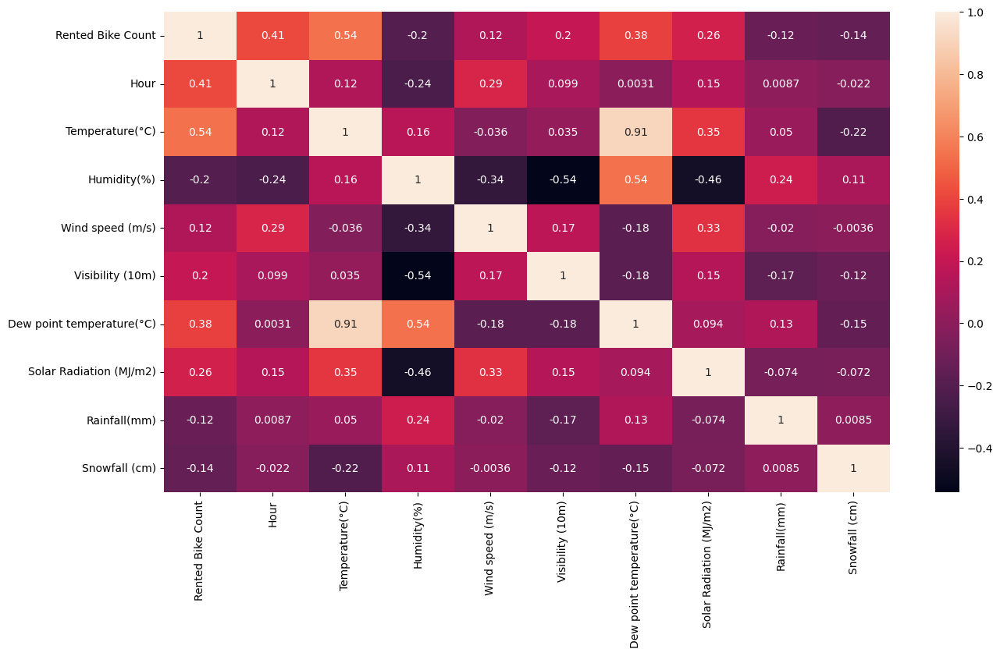

In [59]:
# Correlation Heatmap visualization code
plt.figure(figsize=(15,8))
sns.heatmap(new_df[numerical_features].corr(),annot=True)
plt.show()

##### 1. Why did you pick the specific chart?

Correlation heatmap is best suited to visualize correlation of numerical features. It helps to easily understand the correlation of numerical features based on color gradient.

##### 2. What is/are the insight(s) found from the chart?

1.Since dew_point_temperature and temperature have a correlation coefficient of 0.91
2.dew_point_temperature is less correlated to our target variable hence we can drop dew_point_temperature.

3.Will the gained insights help creating a positive business impact?

Are there any insights that lead to negative growth? Justify with specific reason.

The correlation coefficient is an important tool in data analysis and machine learning, as it can help to identify relationships between variables and can be used in feature selection techniques to remove highly correlated features, which can reduce overfitting and improve the performance of the model.

Example :

Since dew_point_temperature and temperature have a correlation coefficient of 0.91 and dew_point_temperature is less correlated to our target variable hence dropping dew_point_temperature.

#### Chart - 15 - Pair Plot

<Figure size 2000x4000 with 0 Axes>

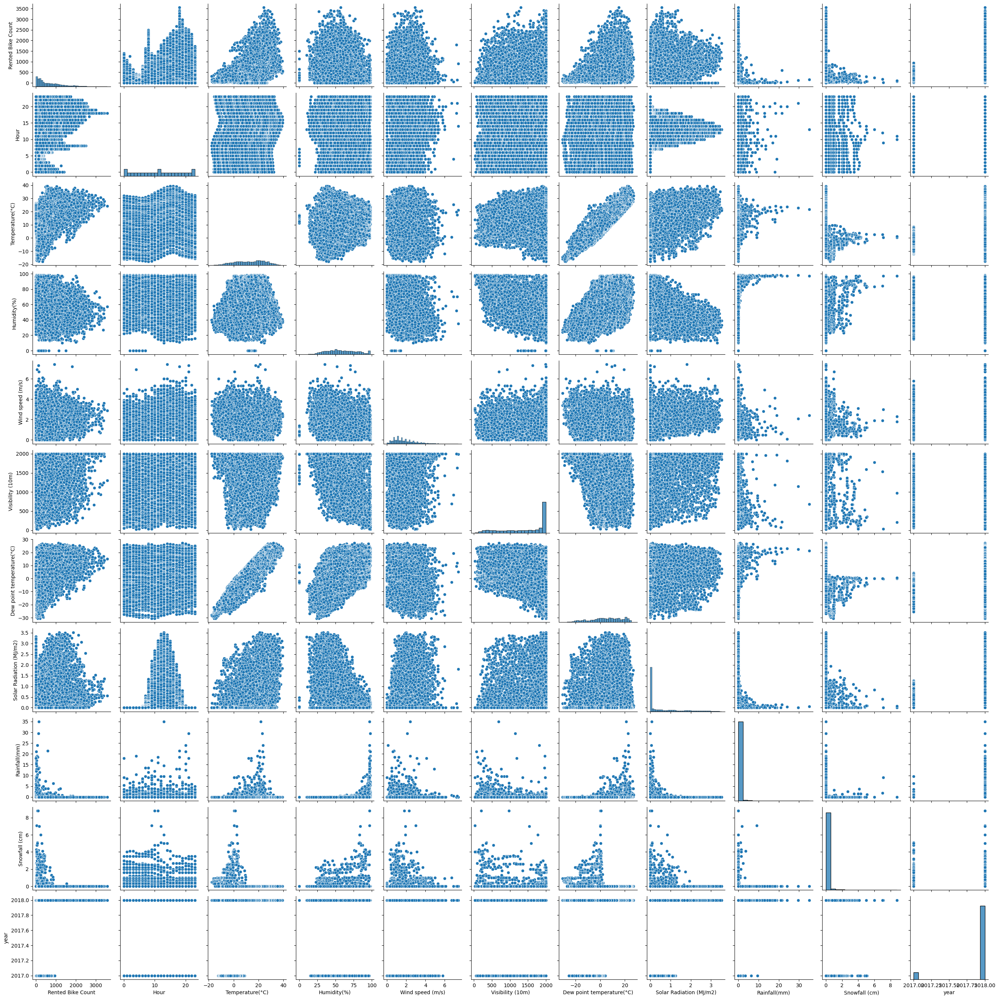

In [60]:
# Pair Plot visualization code
plt.figure(figsize=(20,40))
sns.pairplot(new_df)
plt.show()

##### 1. Why did you pick the specific chart?

it simultaneously visualizes multiple variables in a single figure. Each scatter plot in the pairplot represents a bivariate relationship (two variables), while the overall matrix of plots encompasses multiple variables, making it a multivariate analysis technique.

Pairplots allow you to see pairwise relationships between all combinations of variables in a dataset. This helps in identifying correlations, trends, and patterns among multiple features simultaneously.

##### 2. What is/are the insight(s) found from the chart?

We can see the Year column is not showing any relationship between variable and we can drop the year column.


## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

1.Rented Bike Demand in hot weather is higher compared to demand in cold weather.

2.ented Bike Demand during rush hour (7-9AM & 5-7PM) and non-rush hour are different.

3.Average Rented Bike Demand is different in different seasons.

### Hypothetical Statement - 1

Rented Bike Demand in hot weather is higher compared to demand in cold weather.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null hypothesis(H₀) : There is no difference in rented bike demand between hot and cold weather. Mathematically, this can be expressed as:

μ
hot =
μ
cold

Alternative Hypothesis (H₁): Rented bike demand in hot weather is higher than in cold weather. This can be expressed as:

μ
hot >
μ
cold



#### 2. Perform an appropriate statistical test.

In [61]:
# Split the data into the 'hot' and 'cold' temperature groups
hot_temps = new_df[new_df['Temperature(°C)'] >= 20]['Rented Bike Count']
cold_temps = new_df[new_df['Temperature(°C)'] < 20]['Rented Bike Count']

In [62]:
# Sample sizes for different temperature groups
print("Hot Temp sample size:", hot_temps.shape[0])
print("Cold Temp sample size:", cold_temps.shape[0])

Hot Temp sample size: 2928
Cold Temp sample size: 5832


In [63]:
# Perform Statistical Test to obtain P-Value
mean_hot = hot_temps.mean()
mean_cold = cold_temps.mean()
std_hot = hot_temps.std(ddof=1) # Sample standard deviation
std_cold = cold_temps.std(ddof=1)
print("Mean Rented Bike Demand in Hot Weather:", mean_hot)
print("Mean Rented Bike Demand in Cold Weather:", mean_cold)
print("Standard Deviation of Rented Bike Demand in Hot Weather:", std_hot)
print("Standard Deviation of Rented Bike Demand in Cold Weather:", std_cold)
print("Cold temperature Bike Demand Variance: ", np.var(cold_temps))
print("Hot temperature Bike Demand Variance: ", np.var(hot_temps))

Mean Rented Bike Demand in Hot Weather: 1116.6103142076502
Mean Rented Bike Demand in Cold Weather: 497.75017146776406
Standard Deviation of Rented Bike Demand in Hot Weather: 710.8540214595747
Standard Deviation of Rented Bike Demand in Cold Weather: 493.1904137922089
Cold temperature Bike Demand Variance:  243195.07698899656
Hot temperature Bike Demand Variance:  505140.8600985332


In [64]:
# Perform the t-test
import scipy
t_stat, p_val1 = scipy.stats.ttest_ind(hot_temps, cold_temps, equal_var=False)
print(f't_stat : {t_stat}')
print(f'p_val1 : {p_val1}')

alpha = 0.05
if p_val1 < alpha:
    print("Reject the null hypothesis: Rented bike demand in hot weather is significantly higher than in cold weather.")
else:
    print("Fail to reject the null hypothesis: No significant difference in rented bike demand between hot and cold weather.")


t_stat : 42.27606983032126
p_val1 : 0.0
Reject the null hypothesis: Rented bike demand in hot weather is significantly higher than in cold weather.


##### Which statistical test have you done to obtain P-Value?

I have used Two sample T-test as the statistical testing to obtain P-Value and found the result that Null hypothesis has been rejected and Mean Rented Bike counts is greater in hot temperatures than cold temperaures.

##### Why did you choose the specific statistical test?

The two sample t-test is used to determine if there is a significant difference between the means of two groups, making it an appropriate test for comparing the mean number of Rented Bike Count between the hot and cold temperature groups.

### Hypothetical Statement - 2

Rented Bike Demand during rush hour (7-9AM & 5-7PM) is higher compared to non-rush hour.



#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (H₀)
The null hypothesis states that there is no difference in rented bike demand between rush hours and non-rush hours:

μ
rush =
μ
non rush


Alternative Hypothesis (H₁)
The alternative hypothesis states that rented bike demand during rush hours is higher than during non-rush hours:

μ
rush >
μ
non rush



#### 2. Perform an appropriate statistical test.

In [65]:
# Create subsets of the data based on hour
rush_hour = df[(df['Hour'] >= 7) & (df['Hour'] <= 9) | (df['Hour'] >= 17) & (df['Hour'] <= 19)]['Rented Bike Count']
non_rush_hour = df[~((df['Hour'] >= 7) & (df['Hour'] <= 9) | (df['Hour'] >= 17) & (df['Hour'] <= 19))]['Rented Bike Count']


In [66]:
# Sample sizes for different hours
print("Rush Hour sample size:", rush_hour.shape[0])
print("Non-Rush Hour sample size:", non_rush_hour.shape[0])

Rush Hour sample size: 2190
Non-Rush Hour sample size: 6570


In [67]:
print("Rush Hour Bike Demand Variance: ", np.var(rush_hour))
print("Non-Rush Hour Bike Demand Variance: ", np.var(non_rush_hour))
print("Rush Hour Bike Demand Mean: ", rush_hour.mean())
print("Non-Rush Hour Bike Demand Mean: ", non_rush_hour.mean())
print("Rush Hour Bike Demand Standard deviation: ", rush_hour.std(ddof=1))
print("Non-Rush Hour Bike Demand Standard deviation: ", non_rush_hour.std(ddof=1))

Rush Hour Bike Demand Variance:  651191.7549926001
Non-Rush Hour Bike Demand Variance:  294088.66494823125
Rush Hour Bike Demand Mean:  1017.37899543379
Non-Rush Hour Bike Demand Mean:  600.3430745814308
Rush Hour Bike Demand Standard deviation:  807.1488330309489
Non-Rush Hour Bike Demand Standard deviation:  542.3406992991448


In [68]:
# Perform Statistical Test to obtain P-Value
# Conduct a two-sample t-test to compare the mean bike rental demand during rush hour with the mean bike rental demand during non-rush hour times
t_stat, p_val2 = scipy.stats.ttest_ind(rush_hour, non_rush_hour, equal_var=False)

# Print the t-test results
print('t-statistic:', t_stat)
print('p-value:', p_val2)
alpha = 0.05
if p_val2 < alpha:
    print(f"Reject the null hypothesis: Rented bike demand in rush_hour is significantly higher than in non_rush_hour.")
else:
  print(f"Fail to reject the null hypothesis: No significant difference in rented bike demand between rush and non_rush weather.")


t-statistic: 22.542388723325413
p-value: 9.381784283723713e-104
Reject the null hypothesis: Rented bike demand in rush_hour is significantly higher than in non_rush_hour.


##### Which statistical test have you done to obtain P-Value?

I have used Two sample T-test as the statistical testing to obtain P-Value and found the result that Null hypothesis has been rejected and Mean Rented Bike count higher in rush hours than non-rush hours.

##### Why did you choose the specific statistical test?

The two sample t-test is used to determine if there is a significant difference between the means of two groups, making it an appropriate test for comparing the mean number of Rented Bike Count between the rush hours and non-rush hours.

### Hypothetical Statement - 3

Rented Bike Demand is different in different seasons with highest in summer and lowest in winter.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (H₀) : The null hypothesis states that there is no difference in rented bike demand among the seasons:

μ
summer =
μ
spring =
μ
fall =
μ
winter

Alternative Hypothesis (H₁) :
The alternative hypothesis states that rented bike demand is different across seasons, specifically that summer has the highest demand and winter has the lowest:

μ
summer >
μ
Autumn >
μ
Spring >
μ
winter




#### 2. Perform an appropriate statistical test.

In [69]:
# Sample sizes for different seasons
total_seasonal_demand = new_df.groupby('Seasons')['Rented Bike Count'].sum().sort_values(ascending = False)
print(total_seasonal_demand)

Seasons
Summer    2283234
Autumn    1790002
Spring    1611909
Winter     487169
Name: Rented Bike Count, dtype: int64


In [70]:
Average_seasonal_demand = new_df.groupby('Seasons')['Rented Bike Count'].mean().sort_values(ascending = False)
print(Average_seasonal_demand)

Seasons
Summer    1034.073370
Autumn     819.597985
Spring     730.031250
Winter     225.541204
Name: Rented Bike Count, dtype: float64


In [71]:
# Conduct the ANOVA test
f_stat, p_val3 = scipy.stats.f_oneway(new_df.loc[df['Seasons']=='Spring', 'Rented Bike Count'],
                                  new_df.loc[df['Seasons']=='Summer', 'Rented Bike Count'],
                                  new_df.loc[df['Seasons']=='Autumn', 'Rented Bike Count'],
                                  new_df.loc[df['Seasons']=='Winter', 'Rented Bike Count'])

# Print the results
print('F-statistic:', f_stat)
print('p-value:', p_val3)
print()

# Conclusion based on p-value
alpha = 0.05
if p_val3 < alpha:
    print("Reject the null hypothesis: There are significant differences in rented bike demand across different seasons.")
else:
    print("Fail to reject the null hypothesis: No significant differences in rented bike demand across seasons.")

F-statistic: 776.4678149879506
p-value: 0.0

Reject the null hypothesis: There are significant differences in rented bike demand across different seasons.


##### Which statistical test have you done to obtain P-Value?

I have used One-way ANOVA test as the statistical testing to obtain P-Value and found the result that Null hypothesis has been rejected and Mean Rented Bike counts are significantly different in different seasons.

##### Why did you choose the specific statistical test?

To determine if there are significant differences in bike rental demand between the seasons, we can use ANOVA (Analysis of Variance), which is appropriate for comparing means across multiple groups.

## ***6. Feature Engineering & Data Pre-processing***



Till now we have only analyze our dataset such as
1. Basic checks
2. Univariate analysis
3. Bivariate analysis
4. Multivariate analysis
5. Hypothesis testing

Now Feature engineering is a crucial process in machine learning that involves transforming raw data into meaningful features that can enhance model performance. This process includes selecting, creating, and manipulating features to ensure they are suitable for the algorithms used in machine learning.


### 1. Handling Missing Values

In [72]:
# Handling Missing Values & Missing Value Imputation
new_df.isnull().sum().sum()

0

#### What all missing value imputation techniques have you used and why did you use those techniques?

We don't have any missing value in our dataset.

### 2. Handling Outliers

We have already plot a graph to detect the outliers in the numerical columns including target variable and independent variable while performing univariate and bivariate analysis.

form the respective graphs we can see that there are outliers in the below columns

[Rented Bike Count , Wind speed (m/s) , Solar Radiation (MJ/m2), Rainfall(mm), Snowfall (cm)]

In [73]:
outlier_column = ['Rented Bike Count','Wind speed (m/s)','Solar Radiation (MJ/m2)','Rainfall(mm)','Snowfall (cm)']

In [74]:
# get the percentage of outliers present in the features

import pandas as pd

def outlier_percentage(df, columns):
  outlier_percentages = {}
  for col in outlier_column:
    # Calculate Q1, Q3, and IQR
    Q1 = new_df[col].quantile(0.25)
    Q3 = new_df[col].quantile(0.75)
    IQR = Q3 - Q1

    # Define outlier boundaries
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Count outliers
    outliers = new_df[(new_df[col] < lower_bound) | (new_df[col] > upper_bound)]
    outlier_count = len(outliers)

    # Calculate percentage
    outlier_percentage = (outlier_count / len(df)) * 100
    outlier_percentages[col] = outlier_percentage

  return pd.Series(outlier_percentages)

# Example usage (assuming 'new_df' and 'outlier_column' are defined as in your provided code)
outlier_percentages = outlier_percentage(new_df, outlier_column)
outlier_percentages

,0
Rented Bike Count,1.803653
Wind speed (m/s),1.837900
Solar Radiation (MJ/m2),7.317352
Rainfall(mm),6.027397
Snowfall (cm),5.057078


Below columns have outliers greater than 5 % and need to treat further
1. Snowfall (cm)
2. Rainfall(mm)
3.Solar Radiation (MJ/m2)

In [75]:
#function to calculate the upper and lower bound
def getOutlierBoundaryIQR(df, feature):
  Q1 = df[feature].quantile(0.25)
  Q3 = df[feature].quantile(0.75)
  IQR= Q3 - Q1
  lower_bridge = Q1 - 1.5*IQR
  upper_bridge =Q3 + 1.5*IQR
  if upper_bridge == 0.0 and lower_bridge == 0.0:
    lower_bridge = df[feature].quantile(0.01)
    upper_bridge = df[feature].quantile(0.99)
  return upper_bridge,lower_bridge

In [76]:
#get the value of upper and lower bound for snowfall column
getOutlierBoundaryIQR(new_df,'Snowfall (cm)')

(2.5, 0.0)

In [77]:
# Get value of upper and lower bound for rainfall column
getOutlierBoundaryIQR(new_df,'Rainfall(mm)')

(4.0, 0.0)

In [78]:
# Get value of upper and lower bound for solar radiation column
getOutlierBoundaryIQR(new_df,'Solar Radiation (MJ/m2)')

(2.325, -1.395)

In [79]:
# outlier treatment for Rainfall column
upper_bound_Rainfall = new_df['Rainfall(mm)'].quantile(0.99)
lower_bound_Rainfall= new_df['Rainfall(mm)'].quantile(0.01)

#replace exterme outliers from the rainfall column woth upper and lower bound.
new_df['Rainfall(mm)'] = new_df['Rainfall(mm)'].clip(lower_bound_Rainfall, upper_bound_Rainfall)


In [80]:
# outlier treatment for Snowfall column
upper_bound_Snowfall = new_df['Snowfall (cm)'].quantile(0.99)
lower_bound_Snowfall = new_df['Snowfall (cm)'].quantile(0.01)

#replace exterme outliers from the rainfall column woth upper and lower bound.
new_df['Snowfall (cm)'] = new_df['Snowfall (cm)'].clip(lower_bound_Snowfall, upper_bound_Snowfall)

In [81]:
# Outlier treatement for solar radiation column
Q1 = df['Solar Radiation (MJ/m2)'].quantile(0.25)
Q3 = df['Solar Radiation (MJ/m2)'].quantile(0.75)
IQR = Q3 - Q1
lower_bound_SR = Q1 - 1.5*IQR
upper_bound_SR = Q3 + 1.5*IQR

new_df['Solar Radiation (MJ/m2)'] = new_df['Solar Radiation (MJ/m2)'].clip(lower_bound_SR, upper_bound_SR)


###What all outlier treatment techniques have you used and why did you use those techniques?

1.Snowfall and Rainfall column:

Upper and lower Bound for both the features snowfall and rainfall is 0.0

Instead of strictly using IQR, we calculate bounds using percentiles (e.g., 1st and 99th percentiles) to allow for a broader range of acceptable values.

So basically it will include upto 99 percentage of value from snowfall and rainfall features and we will use capping method to replace the extreme value of outliers with the outer and lower bound

2.Solar radiation:

Upper and lower bound for solar radiation column is 2.325, -1.395 respectively
when we used standard IQR method

and hence we clipped the value of solar radiation using standard mwthod

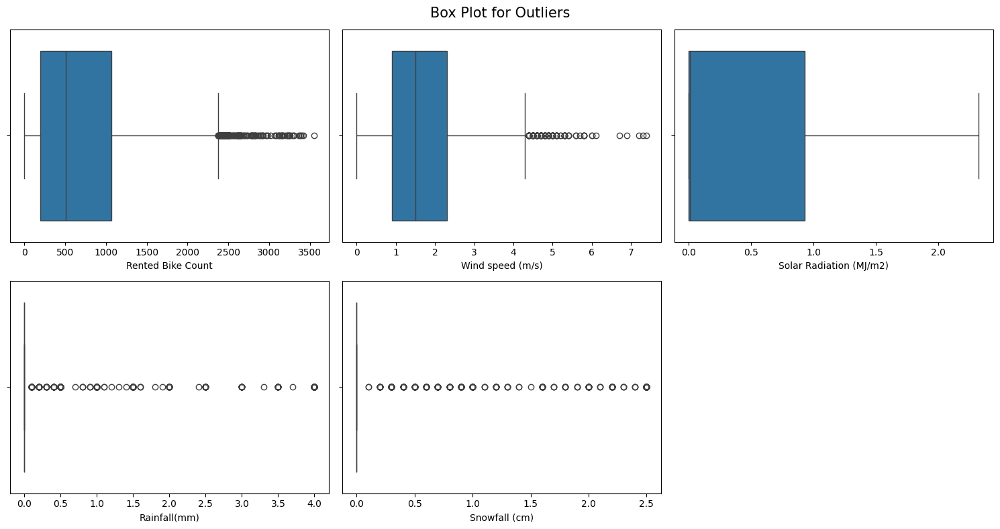

In [82]:
# lets plot a box plot for outlier_column
plt.figure(figsize = (15,8))
plt.suptitle('Box Plot for Outliers', fontsize = 15)
for n , i in enumerate(outlier_column):
  plt.subplot(2,3,n+1)
  sns.boxplot(x = new_df[i])
plt.tight_layout()
plt.show()

In [83]:
# Calculate reduced outlier_percentage
reduced_percentage = outlier_percentage(new_df, outlier_column)
reduced_percentage

,0
Rented Bike Count,1.803653
Wind speed (m/s),1.837900
Solar Radiation (MJ/m2),0.000000
Rainfall(mm),6.027397
Snowfall (cm),5.057078


It is evident that the extreme outliers in the top and lower ranges for solar radiation have been successfully trimmed.

We maximise the margin and use the 99 percentile for rainfall and snowfall because the traditional IQR approach treated all of the values as outliers. There is no change in the outlier percentage of rainfall and snowfall because the reduced percentage displays the outliers percentage by taking Standard IQR into account. However, it is evident from the box plot of rainfall and snowfall that some of the outliers are clipped within the upper and lower bounds.


### 3. Categorical Encoding

In [84]:
# Encode your categorical columns
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Seasons                    8760 non-null   object 
 11  Holiday                    8760 non-null   object 
 12  Functioning Day            8760 non-null   object 
 13  month                      8760 non-null   objec

In [85]:
categorical_features

Index(['Seasons', 'Holiday', 'Functioning Day', 'month', 'day', 'year',
       'Time_of_Day', 'Day_Type'],
      dtype='object')

In [86]:
#columns to encoded using one hot encoding
dummy_columns = ['Seasons','Holiday','Day_Type']
#Get encoded dataframe
df_encoded = pd.get_dummies(new_df, columns=dummy_columns, drop_first=True, dtype = int)
df_encoded.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Functioning Day,month,day,year,Time_of_Day,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday,Day_Type_weekend
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Yes,Dec,Friday,2017,night,0,0,1,1,0


In [87]:
df_encoded.shape

(8760, 20)

In [88]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Rented Bike Count          8760 non-null   int64  
 1   Hour                       8760 non-null   int64  
 2   Temperature(°C)            8760 non-null   float64
 3   Humidity(%)                8760 non-null   int64  
 4   Wind speed (m/s)           8760 non-null   float64
 5   Visibility (10m)           8760 non-null   int64  
 6   Dew point temperature(°C)  8760 non-null   float64
 7   Solar Radiation (MJ/m2)    8760 non-null   float64
 8   Rainfall(mm)               8760 non-null   float64
 9   Snowfall (cm)              8760 non-null   float64
 10  Functioning Day            8760 non-null   object 
 11  month                      8760 non-null   object 
 12  day                        8760 non-null   object 
 13  year                       8760 non-null   objec

###Wait wait wait.... have you noticed something ?

1. get_dummies method primarily convert the categorical column to boolean
2. we need to add dtype = int argument in the methd to get the output in integer format
3. when we set drop_first=True it will drop original categorical column along with one encoded dummy column also.

example:

We have season column which contains 4 season, but when we encoded the column keepig drop_first = true it drop original Season column and also dropped 1 season (Autumn) column and keep only 3 season columns.

But why this is happend and is it important ?

Yes it is very important As the sum of one-hot encoded features is always 1, it leads to perfect multicollinearity.
This is often called the Dummy Variable Trap

It is bad because:

The model has redundant features

Regressions coefficients aren’t reliable in the presence of multicollinearity, etc.

So how to resolve this?

The solution is simple.

Drop any arbitrary feature from the one-hot encoded features. which get_dummies method have that capability and it removed the arbitary feature

This instantly mitigates multicollinearity and breaks the linear relationship which existed before.

#### What all categorical encoding techniques have you used & why did you use those techniques?

One-hot encoding is a technique used to transform categorical variables into a format that can be effectively utilized by machine learning algorithms. This process involves creating new binary columns for each unique category in the categorical feature. Each column indicates the presence (1) or absence (0) of a category for each observation.

### 4. Feature Manipulation & Selection

Deleting some extra features like 'day','Time_of_Day','year' and 'month' because

1. day has been converted into Day_type.
2. month because it is already shorten to seasons.
3. year because it does not have much variation and there is less to learn from that.
4. Time_of_Day as keeping hour since it show good correlation.
5. We have rented bke count only for Functioning day, if we kept this it will cause overfitting , hence will reomove this feature also.

#### 1. Feature Manipulation

In [89]:
# Removing unwanted features
df_encoded = df_encoded.drop(['day','Time_of_Day','year','month','Functioning Day'], axis=1)
df_encoded.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday,Day_Type_weekend
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,0,0,1,1,0


In [90]:
df_encoded.shape

(8760, 15)

#### 2. Feature Selection

Multicollinearity can significantly impact the performance and interpretability of regression models. When predictors are highly correlated, it can lead to unreliable coefficient estimates, inflated standard errors, and difficulties in determining the importance of individual features.

Compute VIF for each feature; a VIF value above 10 is often considered indicative of problematic multicollinearity.

Also consider Calculate the correlation coefficients between features to identify pairs with high correlations (close to +1 or -1).

In [91]:
# Checking for multicollinearity
# imports the variance_inflation_factor function from the statsmodels library.
from statsmodels.stats.outliers_influence import variance_inflation_factor
# define a function to calculate vif
def calculate_vif(dataframe):
    vif = pd.DataFrame()
    vif["feature"] = dataframe.columns
    vif["VIF"] = [variance_inflation_factor(dataframe.values, i) for i in range(len(dataframe.columns))]
    return vif.sort_values(by='VIF', ascending=False)


In [92]:
calculate_vif(df_encoded[[i for i in df_encoded.describe().columns if i not in ['Rented Bike Count']]])

,feature,VIF
1,Temperature(°C),43.292150
5,Dew point temperature(°C),27.511464
12,Holiday_No Holiday,19.830855
2,Humidity(%),18.203474
4,Visibility (10m),9.845515
3,Wind speed (m/s),4.936277
0,Hour,4.519692
11,Seasons_Winter,4.299346
10,Seasons_Summer,3.322436
6,Solar Radiation (MJ/m2),2.991077


Temperature and dew point temperature have maximum value of VIF. we need to remove one of the column.

lets analyze the correlation between temperature and dew point temperature and also with our target variable. the feature which is less correlated with target variable we will remove that feature

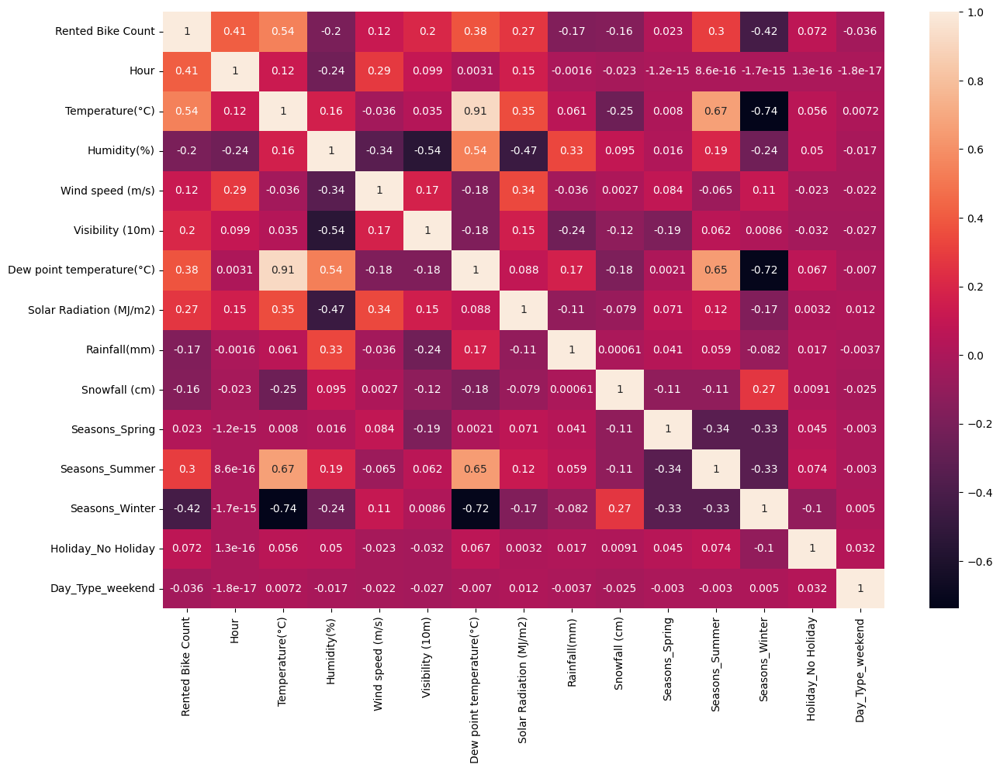

In [93]:
plt.figure(figsize=(15,10))
sns.heatmap(df_encoded.corr(),annot=True)
plt.show()

Feature Temperature(°C) and Dew point temperature(°C) show correlation of 0.91 which an absolute correlation coefficient of > 0.7 among two or more predictors indicates the presence of multicollinearity.

same is confirm by VIF also.


Correlation of temperature and dew point temperature with target variable

In [94]:
correlation_matrix = df_encoded[['Temperature(°C)', 'Dew point temperature(°C)', 'Rented Bike Count']].corr()
correlation_matrix

,Temperature(°C),Dew point temperature(°C),Rented Bike Count
Temperature(°C),1.000000,0.912798,0.538558
Dew point temperature(°C),0.912798,1.000000,0.379788
Rented Bike Count,0.538558,0.379788,1.000000


temperature is highly correlated with target variable [0.538] compare to dew point temperature [0.379] and hence will remove dew point temperature

In [95]:
df_encoded = df_encoded.drop(['Dew point temperature(°C)'],axis=1)
df_encoded.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday,Day_Type_weekend
0,254,0,-5.2,37,2.2,2000,0.0,0.0,0.0,0,0,1,1,0


In [96]:
#again calculate VIF
calculate_vif(df_encoded[[i for i in df_encoded.describe().columns if i not in ['Rented Bike Count']]])

,feature,VIF
11,Holiday_No Holiday,16.027228
2,Humidity(%),11.104211
1,Temperature(°C),10.518058
4,Visibility (10m),6.455414
3,Wind speed (m/s),4.869539
0,Hour,4.333338
10,Seasons_Winter,3.593492
9,Seasons_Summer,3.249478
5,Solar Radiation (MJ/m2),2.617844
8,Seasons_Spring,2.052636


Now holiday_no holiday column is having Highest VIF

In [97]:
#again calculate VIF eliminating holiday_no holiday column
calculate_vif(df_encoded[[i for i in df_encoded.describe().columns if i not in ['Rented Bike Count','Holiday_No Holiday']]])

,feature,VIF
1,Temperature(°C),10.517327
2,Humidity(%),6.892496
4,Visibility (10m),5.224885
3,Wind speed (m/s),4.857751
0,Hour,4.239643
10,Seasons_Winter,3.519992
9,Seasons_Summer,3.244965
5,Solar Radiation (MJ/m2),2.522424
8,Seasons_Spring,1.987410
11,Day_Type_weekend,1.386415


When we consider to remove holiday_noholiday column then all the features are having the VIF near to 10 only

In [98]:
df_encoded = df_encoded.drop(['Holiday_No Holiday'],axis=1)
df_encoded.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Day_Type_weekend
0,254,0,-5.2,37,2.2,2000,0.0,0.0,0.0,0,0,1,0


In [99]:
calculate_vif(df_encoded[[i for i in df_encoded.describe().columns if i not in ['Rented Bike Count']]])

,feature,VIF
1,Temperature(°C),10.517327
2,Humidity(%),6.892496
4,Visibility (10m),5.224885
3,Wind speed (m/s),4.857751
0,Hour,4.239643
10,Seasons_Winter,3.519992
9,Seasons_Summer,3.244965
5,Solar Radiation (MJ/m2),2.522424
8,Seasons_Spring,1.987410
11,Day_Type_weekend,1.386415


Now everthing looks fine and we are good go with remaining features

##### What all feature selection methods have you used  and why?

We have used VIF and Correlation concept to select appropriate features

##### Which all features you found important and why?

Based on EDA and correlation heatmap in above section, we saw various features that has impact on target variable output. For example, we saw how ***temperature*** increase causes demand to increase, ***rainfall*** and ***snowfall*** decreases the demand, certain ***seasons*** have higher demand compared to other seasons, certain ***hour*** (rush hour) have more demand, ***visibility*** has posivitive effect on demand, too much ***humidity*** decreases demand etc.

In [100]:
df_encoded.head(1)

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Day_Type_weekend
0,254,0,-5.2,37,2.2,2000,0.0,0.0,0.0,0,0,1,0


In [101]:
df_encoded.shape

(8760, 13)

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

We can see from univariate analysis , the distribution of some numerical features are skewed.

The features are as follows :
1. Rented Bike Count
2. Wind speed (m/s)
3. Visibility (10m)
4. Solar Radiation (MJ/m2)



Verify log, sqrt, and cbrt transformations; the transformation that produces the best results will be chosen.

In [102]:
# Transform Your data
features_to_transform = ['Rented Bike Count','Wind speed (m/s)','Visibility (10m)','Solar Radiation (MJ/m2)']

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


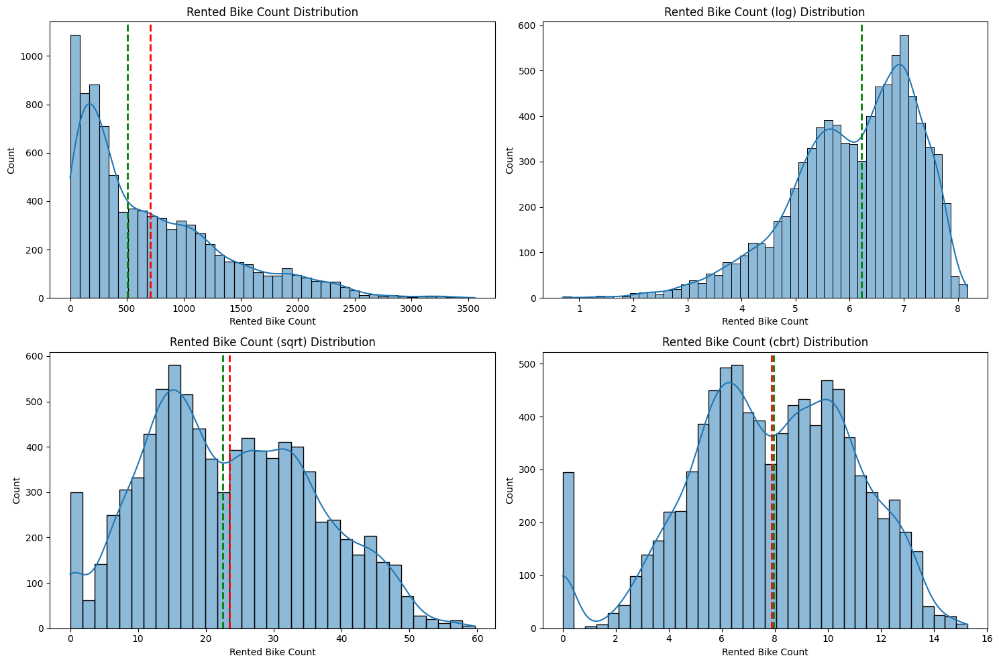

In [103]:

# Transforming 'Rented Bike Count' to normal
plt.figure(figsize=(15,10))

# original distribution
plt.subplot(2,2,1)
sns.histplot(df_encoded['Rented Bike Count'], kde=True)
plt.title("Rented Bike Count Distribution")
plt.axvline(df_encoded['Rented Bike Count'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(df_encoded['Rented Bike Count'].median(), color='green', linestyle='dashed', linewidth=2)

#logarithmic distribution
plt.subplot(2,2,2)
sns.histplot(np.log(df_encoded['Rented Bike Count']), kde=True)
plt.title("Rented Bike Count (log) Distribution")
plt.axvline(np.log(df_encoded['Rented Bike Count']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.log(df_encoded['Rented Bike Count']).median(), color='green', linestyle='dashed', linewidth=2)

#Square root transformation
plt.subplot(2,2,3)
sns.histplot(np.sqrt(df_encoded['Rented Bike Count']), kde=True)
plt.title("Rented Bike Count (sqrt) Distribution")
plt.axvline(np.sqrt(df_encoded['Rented Bike Count']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.sqrt(df_encoded['Rented Bike Count']).median(), color='green', linestyle='dashed', linewidth=2)

#cube root transformation
plt.subplot(2,2,4)
sns.histplot(np.cbrt(df_encoded['Rented Bike Count']), kde=True)
plt.title("Rented Bike Count (cbrt) Distribution")
plt.axvline(np.cbrt(df_encoded['Rented Bike Count']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.cbrt(df_encoded['Rented Bike Count']).median(), color='green', linestyle='dashed', linewidth=2)

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


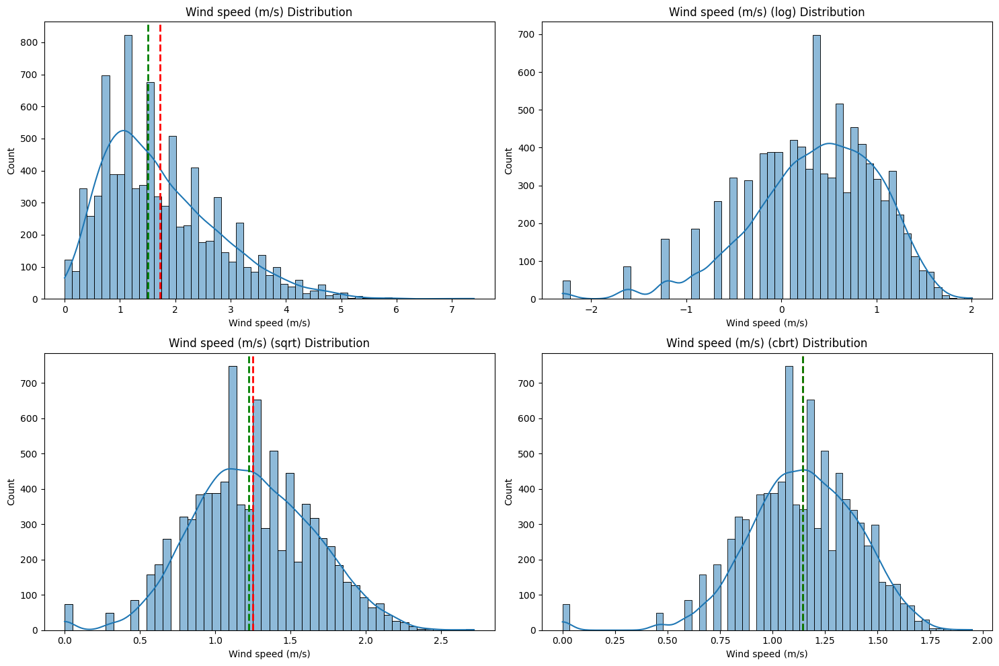

In [104]:
# Transforming 'Wind speed (m/s)' to normal
plt.figure(figsize=(15,10))

# original distribution
plt.subplot(2,2,1)
sns.histplot(df_encoded['Wind speed (m/s)'], kde=True)
plt.title("Wind speed (m/s) Distribution")
plt.axvline(df_encoded['Wind speed (m/s)'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(df_encoded['Wind speed (m/s)'].median(), color='green', linestyle='dashed', linewidth=2)

#logarithmic distribution
plt.subplot(2,2,2)
sns.histplot(np.log(df_encoded['Wind speed (m/s)']), kde=True)
plt.title("Wind speed (m/s) (log) Distribution")
plt.axvline(np.log(df_encoded['Wind speed (m/s)']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.log(df_encoded['Wind speed (m/s)']).mean(), color='green', linestyle='dashed', linewidth=2)

#Square root transformation
plt.subplot(2,2,3)
sns.histplot(np.sqrt(df_encoded['Wind speed (m/s)']), kde=True)
plt.title("Wind speed (m/s) (sqrt) Distribution")
plt.axvline(np.sqrt(df_encoded['Wind speed (m/s)']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.sqrt(df_encoded['Wind speed (m/s)']).median(), color='green', linestyle='dashed', linewidth=2)

#cube root transformation
plt.subplot(2,2,4)
sns.histplot(np.cbrt(df_encoded['Wind speed (m/s)']), kde=True)
plt.title("Wind speed (m/s) (cbrt) Distribution")
plt.axvline(np.cbrt(df_encoded['Wind speed (m/s)']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.cbrt(df_encoded['Wind speed (m/s)']).median(), color='green', linestyle='dashed', linewidth=2)

plt.tight_layout()
plt.show()

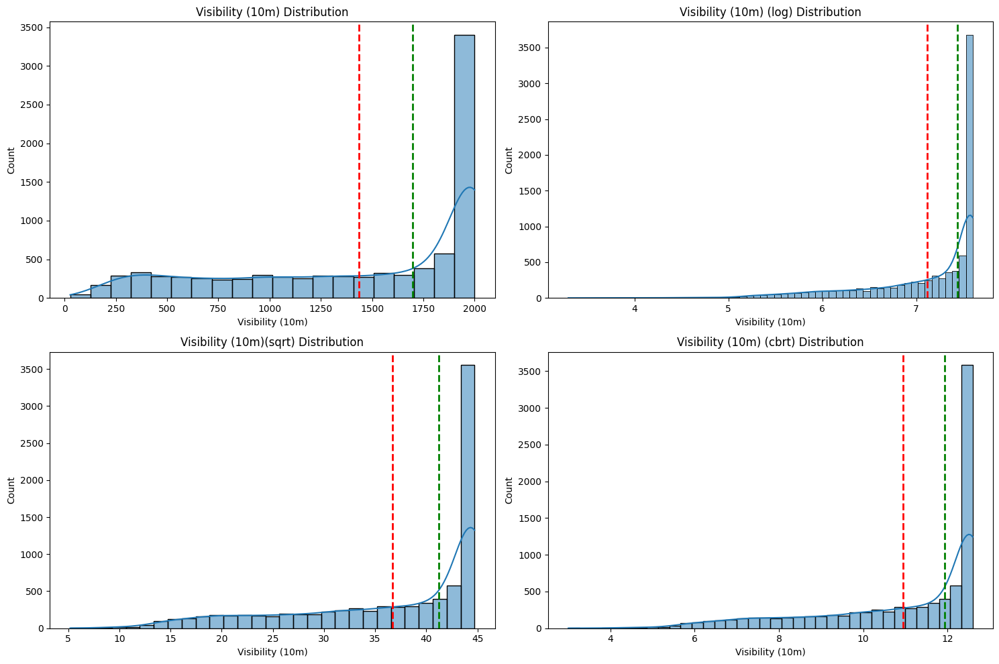

In [105]:
# Transforming 'Visibility (10m)' to normal
plt.figure(figsize=(15,10))

# original distribution
plt.subplot(2,2,1)
sns.histplot(df_encoded['Visibility (10m)'], kde=True)
plt.title("Visibility (10m) Distribution")
plt.axvline(df_encoded['Visibility (10m)'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(df_encoded['Visibility (10m)'].median(), color='green', linestyle='dashed', linewidth=2)

#logarithmic distribution
plt.subplot(2,2,2)
sns.histplot(np.log(df_encoded['Visibility (10m)']), kde=True)
plt.title("Visibility (10m) (log) Distribution")
plt.axvline(np.log(df_encoded['Visibility (10m)']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.log(df_encoded['Visibility (10m)']).median(), color='green', linestyle='dashed', linewidth=2)

#Square root transformation
plt.subplot(2,2,3)
sns.histplot(np.sqrt(df_encoded['Visibility (10m)']), kde=True)
plt.title("Visibility (10m)(sqrt) Distribution")
plt.axvline(np.sqrt(df_encoded['Visibility (10m)']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.sqrt(df_encoded['Visibility (10m)']).median(), color='green', linestyle='dashed', linewidth=2)

#cube root transformation
plt.subplot(2,2,4)
sns.histplot(np.cbrt(df_encoded['Visibility (10m)']), kde=True)
plt.title("Visibility (10m) (cbrt) Distribution")
plt.axvline(np.cbrt(df_encoded['Visibility (10m)']).mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(np.cbrt(df_encoded['Visibility (10m)']).median(), color='green', linestyle='dashed', linewidth=2)

plt.tight_layout()
plt.show()

We noticed that the square root transformation is working well after testing every kind of transformation for wind speed and the number of rented bikes. Thus, the feature will be transformed solely through square root transformation.

Although the cube root transformation is likewise effective, it has the drawback of causing an imbalance in the data set by opening a gap in the distribution. because it's not being used.

In [106]:
# Transforming Rented Bike Count using cube root transformation
for column in features_to_transform:
    df_encoded[column] = np.sqrt(df_encoded[column])


In [107]:
df_encoded.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Day_Type_weekend
0,15.937377,0,-5.2,37,1.483240,44.72136,0.0,0.0,0.0,0,0,1,0
1,14.282857,1,-5.5,38,0.894427,44.72136,0.0,0.0,0.0,0,0,1,0
2,13.152946,2,-6.0,39,1.000000,44.72136,0.0,0.0,0.0,0,0,1,0
3,10.344080,3,-6.2,40,0.948683,44.72136,0.0,0.0,0.0,0,0,1,0
4,8.831761,4,-6.0,36,1.516575,44.72136,0.0,0.0,0.0,0,0,1,0


In [108]:
df_encoded.shape

(8760, 13)

### 6. Data Scaling

Will perform scalling operation after splitting the data using StandardScalar() or MinMaxScalar()

The transformation (in this case, cube root) alters the distribution of the data, and scaling afterward ensures that all features are on a comparable scale based on their new distributions.

##### Which method have you used to scale you data and why?

Use StandardScaler if your transformed data is approximately normally distributed after the cube root transformation. This scaler standardizes features by removing the mean and scaling to unit variance (mean = 0, standard deviation = 1).

Use MinMaxScaler if you want to scale your features to a specific range (typically [0, 1]).

### 7. Dimensionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

After completing all feature engineering procedures, such as eliminating multicolinearity and feature selection manipulations, the dataset has 8760 rows and 13 columns (independent features). In this case, I don't believe dimensionality reduction is necessary.




### 8. Data Splitting

In [109]:
#Create a independent and dependent dataframe
x = df_encoded.drop(['Rented Bike Count'],axis=1)
y= df_encoded['Rented Bike Count']

In [110]:
x.head(2)

,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Day_Type_weekend
0,0,-5.2,37,1.483240,44.72136,0.0,0.0,0.0,0,0,1,0
1,1,-5.5,38,0.894427,44.72136,0.0,0.0,0.0,0,0,1,0


In [111]:
y.head(2)

,Rented Bike Count
0,15.937377
1,14.282857


In [112]:
# Split into training and testing sets (80% train, 20% test)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [113]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(7008, 12)
(1752, 12)
(7008,)
(1752,)


In [114]:
X_train

,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons_Spring,Seasons_Summer,Seasons_Winter,Day_Type_weekend
8415,15,13.2,61,1.974842,26.814175,1.014889,0.0,0.0,0,0,0,0
5049,9,22.9,86,1.303840,23.194827,0.871780,0.0,0.0,0,1,0,0
8395,19,11.2,46,1.183216,29.478806,0.000000,0.0,0.0,0,0,0,0
1535,23,-2.6,69,1.414214,37.868192,0.000000,0.0,0.0,0,0,1,0
5518,22,27.2,73,1.224745,31.701735,0.000000,0.0,0.0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
5734,22,29.9,74,1.414214,34.655447,0.000000,0.0,0.0,0,1,0,0
5191,7,23.5,90,0.707107,21.095023,0.223607,0.5,0.0,0,1,0,0
5390,14,29.5,62,1.643168,44.056782,1.337909,0.0,0.0,0,1,0,0
860,20,-3.4,51,1.048809,37.296112,0.000000,0.0,0.0,0,0,1,0


##### What data splitting ratio have you used and why?

I have used 80:20 ratio to split the data into trainig and testing. this 80:20 ration is widely acceptable. This split provides a good balance between the amount of data available for training and the data reserved for testing. A larger training set helps the model learn better, while a sufficient testing set is crucial for evaluating how well the model generalizes to unseen data.

### 9. Handling Imbalanced Dataset

Plot the Histogram: Use a histogram to visualize the distribution of your target variable. This will help you see how the values are distributed and if there are any significant gaps or underrepresented areas.

Interpret the Histogram: Look for skewness, peaks, and the overall spread of values. An imbalanced dataset may show a concentration of values in certain ranges while having very few observations in others.

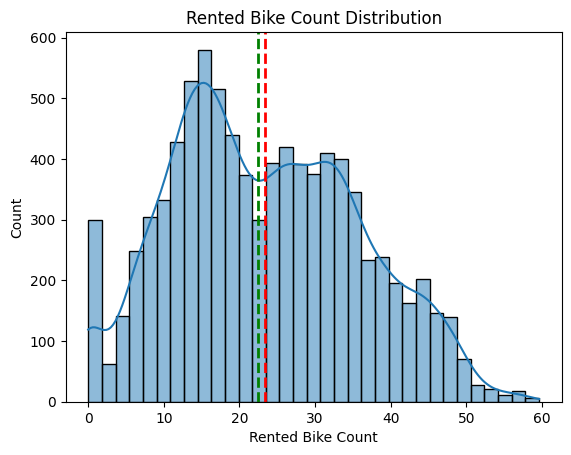

In [115]:
sns.histplot(df_encoded['Rented Bike Count'], kde=True)
plt.title("Rented Bike Count Distribution")
plt.axvline(df_encoded['Rented Bike Count'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(df_encoded['Rented Bike Count'].median(), color='green', linestyle='dashed', linewidth=2)
plt.show()

##### Do you think the dataset is imbalanced? Explain Why.

We can see from the above histogram , the values are distributed evenly and there are no any significant gaps or underrepresented areas. so we can say that the dataset is balanced.

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Our dataset was balanced and hence we have not done anything

##Data Scaling :

In [116]:
#Standardizing the dataset
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
X_train = scalar.fit_transform(X_train)
X_test = scalar.transform(X_test)

#If want to inverse the result to original
# X_train = scalar.inverse_transform(X_train)

In [117]:
X_train

array([[ 0.50542093,  0.02237011,  0.13701177, ..., -0.57778965,
        -0.56834235, -0.63438274],
       [-0.36356579,  0.83822207,  1.35998213, ...,  1.73073366,
        -0.56834235, -0.63438274],
       [ 1.08474541, -0.14584679, -0.59677044, ..., -0.57778965,
        -0.56834235, -0.63438274],
       ...,
       [ 0.36058981,  1.39333784,  0.18593058, ...,  1.73073366,
        -0.56834235, -0.63438274],
       [ 1.22957653, -1.37383015, -0.35217637, ..., -0.57778965,
         1.75950288, -0.63438274],
       [ 1.51923877,  0.53543165, -0.15650112, ..., -0.57778965,
        -0.56834235,  1.57633544]])

In [118]:
X_test

array([[-0.50839691,  1.1998884 ,  0.52836228, ...,  1.73073366,
        -0.56834235, -0.63438274],
       [ 0.07092757,  1.65407403, -0.35217637, ...,  1.73073366,
        -0.56834235, -0.63438274],
       [ 0.36058981,  1.77182586, -0.40109519, ...,  1.73073366,
        -0.56834235, -0.63438274],
       ...,
       [-0.94289027,  0.64477264,  0.33268703, ..., -0.57778965,
        -0.56834235,  1.57633544],
       [-0.65322803, -1.69344226,  0.5772811 , ..., -0.57778965,
         1.75950288, -0.63438274],
       [ 0.21575869,  1.80546924, -0.49893282, ...,  1.73073366,
        -0.56834235, -0.63438274]])

## ***7. ML Model Implementation***

### ML Model - 1 : Linear Regression

In [119]:
# ML Model - 1 Implementation
from sklearn.linear_model import LinearRegression

# Fit the Algorithm
linear_regression= LinearRegression()
linear_regression.fit(X_train,y_train)

# Predict on the model
y_pred_train = linear_regression.predict(X_train)   #----- will get predicted value of y train
y_pred_test = linear_regression.predict(X_test)     #----- will get predicted value of y test


In [120]:
# Checking the coefficients
linear_regression.coef_

array([ 3.78535155,  4.12596048, -2.37696351, -0.1020966 ,  0.05344895,
        0.28809059, -2.48845384,  0.10668682, -0.25083865,  0.64135172,
       -2.85304104, -0.40008788])

In [121]:
# Checking the intercept value
linear_regression.intercept_

23.44110442713799

In [122]:
#Evaluation metrix for regression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [123]:
# Calculate training evaluation metrics
MSE_train = mean_squared_error(y_train,y_pred_train)
RMSE_train = np.sqrt(MSE_train)
MAE_train = mean_absolute_error(y_train,y_pred_train)
r2_train = r2_score(y_train,y_pred_train)
adj_r2_train=1-(1-r2_train)*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1))

#Another way to get r2 score is
##score
# linear_regression.score(X_train, y_train)  ---- training r2 score

print("Training Evaluation Metrics:")
print("Mean Squared Error (MSE):", MSE_train)
print("Root Mean Squared Error (RMSE):", RMSE_train)
print("Mean Absolute Error (MAE):", MAE_train)
print("R-squared (R2) Score:", r2_train)
print("Adjusted R-squared (R2) Score:", adj_r2_train)


Training Evaluation Metrics:
Mean Squared Error (MSE): 76.32193960696168
Root Mean Squared Error (RMSE): 8.73624287705886
Mean Absolute Error (MAE): 6.3628242118969816
R-squared (R2) Score: 0.5084960683266516
Adjusted R-squared (R2) Score: 0.5076528878863257


In [124]:
#calculate testing evaluation matrics
MSE_test = mean_squared_error(y_test,y_pred_test)
RMSE_test = np.sqrt(MSE_test)
MAE_test = mean_absolute_error(y_test,y_pred_test)
r2_test = r2_score(y_test,y_pred_test)
adj_r2_test=1-(1-r2_test)*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1))

#Another way to get r2 score is
##score
# linear_regression.score(X_test, y_test)  ---- testing r2 score


print("Testing Evaluation Metrics:")
print("Mean Squared Error (MSE):", MSE_test)
print("Root Mean Squared Error (RMSE):", RMSE_test)
print("Mean Absolute Error (MAE):", MAE_test)
print("R-squared (R2) Score:", r2_test)
print("Adjusted R-squared (R2) Score:", adj_r2_test)


Testing Evaluation Metrics:
Mean Squared Error (MSE): 74.49111150180424
Root Mean Squared Error (RMSE): 8.630823338581566
Mean Absolute Error (MAE): 6.312321752205766
R-squared (R2) Score: 0.5160293558153088
Adjusted R-squared (R2) Score: 0.5126897078968405


Instead of calculating the performance matrics manually , lets create a function to calculate training and testing accuracy,

just provide the name of model and will get the evaluation matrics

In [125]:
def training_evaluation_matrics(model):
    y_pred_train = model.predict(X_train)

    mse = mean_squared_error(y_train, y_pred_train)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_train, y_pred_train)
    r2 = r2_score(y_train, y_pred_train)

    n = X_train.shape[0]
    p = X_train.shape[1]

    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

    print(f'MSE : {mse:.4f}')
    print(f'RMSE : {rmse:.4f}')
    print(f'MAE : {mae:.4f}')
    print(f'R² : {r2:.4f}')
    print(f'Adjusted R² : {adj_r2:.4f}')


In [126]:
def testing_evaluation_matrics(model):
    y_pred_test = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred_test)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred_test)
    r2 = r2_score(y_test, y_pred_test)

    n = X_test.shape[0]
    p = X_test.shape[1]

    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

    print(f'MSE : {mse:.4f}')
    print(f'RMSE : {rmse:.4f}')
    print(f'MAE : {mae:.4f}')
    print(f'R² : {r2:.4f}')
    print(f'Adjusted R² : {adj_r2:.4f}')

In [127]:
#get training matics
training_evaluation_matrics(linear_regression)

MSE : 76.3219
RMSE : 8.7362
MAE : 6.3628
R² : 0.5085
Adjusted R² : 0.5077


In [128]:
#Get testing matrics
testing_evaluation_matrics(linear_regression)

MSE : 74.4911
RMSE : 8.6308
MAE : 6.3123
R² : 0.5160
Adjusted R² : 0.5127


The performance metrics suggest that while the linear regression model captures some relationship between predictors and the target variable (as indicated by an R² of 0.5160), there is still considerable room for improvement since about 48.4% of the variance is unexplained.

The RMSE and MAE values indicate that, on average, predictions deviate from actual values by about 8.63 and 6.31 units, respectively.

it might be useful to consider feature engineering, adding more relevant features, or trying more complex models (like polynomial regression or ensemble methods) to improve performance.

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

Firstly we have use Linear regression Algorithm and calculates the performance evaluation matrics such as:
1. mean square error
2. root mean square error
3. mean absolute error
4. r2
5. adjusted r2

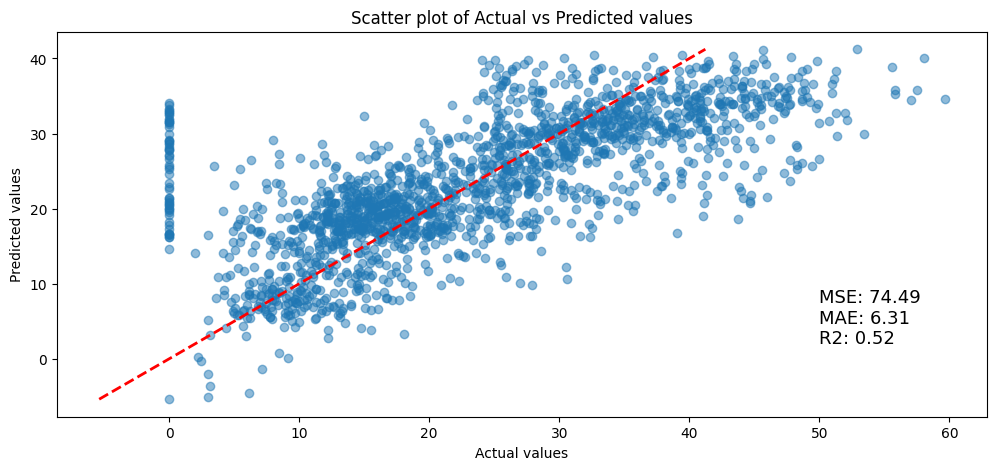

In [129]:
# Visualizing evaluation Metric Score chart
# Create scatter plot
plt.figure(figsize=(12, 5))
plt.scatter(y_test, y_pred_test , alpha = 0.5)
plt.plot([min(y_pred_test), max(y_pred_test)], [min(y_pred_test), max(y_pred_test)], 'r--', lw=2)
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Scatter plot of Actual vs Predicted values')

# Add evaluation metrics to plot
plt.text(50,2 , f'MSE: {MSE_test:.2f}\nMAE: {MAE_test:.2f}\nR2: {r2_test:.2f}', fontsize=13, ha='left')

plt.show()


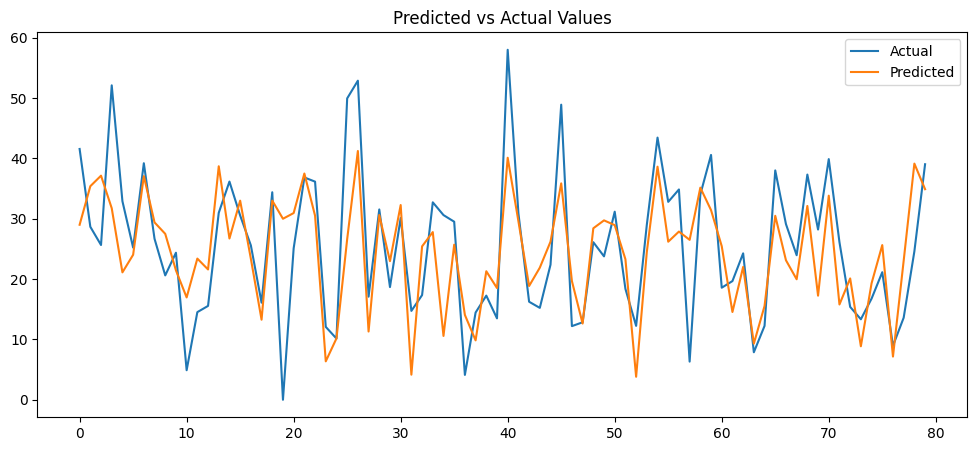

In [130]:
#Plotting Graph of observed vs predicted values
plt.figure(figsize=(12,5))
plt.plot((np.array(y_test)[:80]))
plt.plot((y_pred_test)[:80])
plt.legend(["Actual","Predicted"])
plt.title('Predicted vs Actual Values')
plt.show()

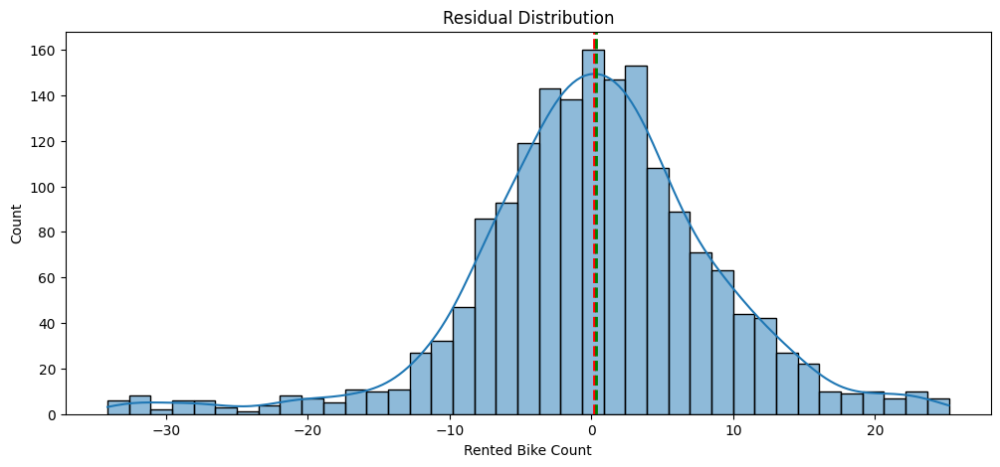

In [131]:
# Residuals of the regression are normally distributed. mean of residue should be zero or close to zero as much as possible.
residue_linear = y_test - y_pred_test
plt.figure(figsize=(12,5))
sns.histplot(residue_linear ,kde=True)
plt.title("Residual Distribution")
plt.axvline(residue_linear.mean(), color='red', linestyle='dashed', linewidth=2)
plt.axvline(residue_linear.median(), color='green', linestyle='dashed', linewidth=2)
plt.show()

In [132]:
residue_mean_linear = residue_linear.mean()
print(residue_mean_linear)

0.199751415022117


In [133]:
residue_median_linear = residue_linear.median()
print(residue_median_linear)

0.29282618784198


The mean of the residual distribution being approximately 0.1998 indicates that, on average, the predicted values from your model are slightly higher than the actual observed values

the mean of the residuals should be close to zero, indicating that predictions are equally distributed above and below the actual values.

Analyzing the mean residual helps in evaluating the overall quality of the regression model. If the mean is not close to zero, it may signal that the model is not capturing some underlying patterns in the data or that there are issues with model specification.

This finding highlights potential areas for improvement and warrants further investigation into model specification and feature selection to enhance predictive accuracy.

Instead of manually ploting the graph for all the models lets create a function to plot all this graphs

In [134]:
def plot_graph(model):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    plt.figure(figsize=(15, 10))
    plt.suptitle('Performance Evaluation Charts')

    #plot 1 : scatter plot
    plt.subplot(2, 2, 1)
    plt.scatter(y_test, y_pred_test, alpha=0.5)
    plt.plot([min(y_pred_test), max(y_pred_test)], [min(y_pred_test), max(y_pred_test)],color='red',linestyle='--', lw=2)
    plt.xlabel('Actual values')
    plt.ylabel('Predicted values')
    plt.title('Actual vs Predicted')

    #plot 2 : Line chart
    plt.subplot(2, 2, 2)
    plt.plot(np.array(y_test[:80]))
    plt.plot(y_pred_test[:80])
    plt.legend(["Actual","Predicted",])
    plt.title('Actual vs Predicted')

    #plot 3 : Residue chart
    plt.subplot(2, 2, 3)
    residue = y_test - y_pred_test
    sns.histplot(residue , kde = True)
    plt.title("Residual Distribution")
    plt.axvline(residue.mean(), color='red', linestyle='dashed', linewidth=2)
    plt.axvline(residue.median(), color='green', linestyle='dashed', linewidth=2)

    plt.tight_layout()
    plt.show()


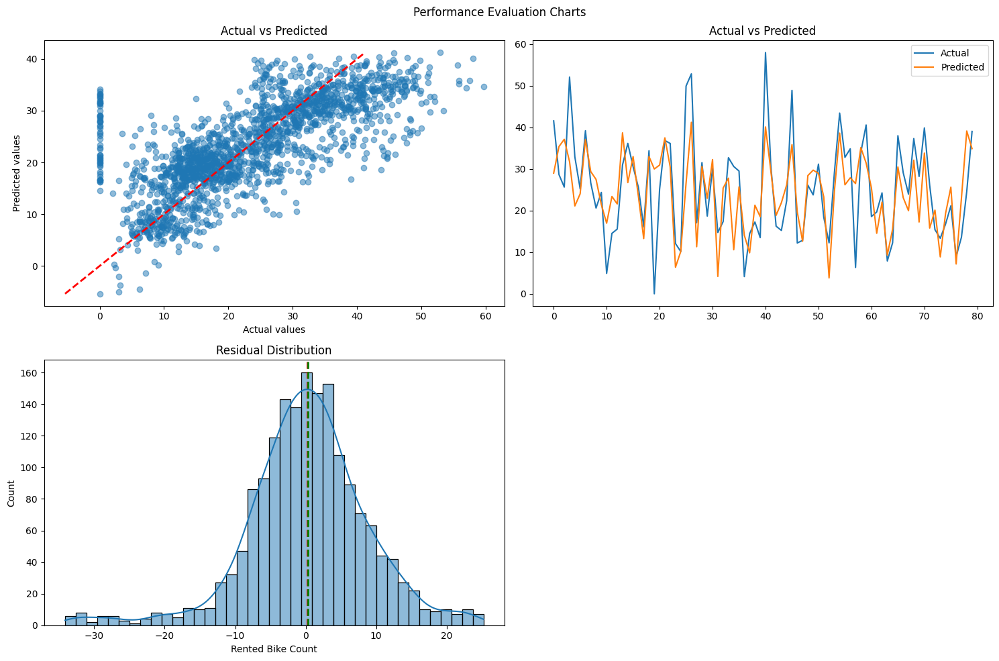

In [135]:
#Performance Evaluation Charts
plot_graph(linear_regression)

To visualize the relationship between predicted values and actual values, the most suitable plot is a scatter plot. This type of plot effectively displays how well the predicted values from your model align with the actual observed values.

Adding a diagonal line (y = x) helps to visualize where the predicted values match the actual values. Points that lie close to this line indicate good predictions.

Points far from this line indicate discrepancies, suggesting areas where the model may underperform.



### 2. Cross- Validation & Hyperparameter Tuning

To perform hyperparameter tuning for a linear regression model in Python, we typically utilize methods such as Grid Search and Random Search. These methods help to identify the best combination of hyperparameters that can enhance the model's performance.

Understanding Hyperparameters in Linear Regression
In standard linear regression, the primary hyperparameters that can be tuned include:

1. fit_intercept': [True, False] --- > Whether to calculate the intercept for this model.

2. n_jobs': [1, -1] -----> Number of jobs for parallel processing

3. copy_X:----> Whether to copy X or not.

4. positive': [True, False] ----->  Coefficients must be non-negative if True

While linear regression does not have as many hyperparameters as other models, tuning these can still improve performance.

Grid Search and Random Search are both techniques used for hyperparameter tuning in machine learning models, helping to find the optimal parameters that enhance model performance.

Grid Search is a systematic approach to hyperparameter tuning where a predefined set of hyperparameters is specified, and the algorithm evaluates all possible combinations of these parameters to determine which combination yields the best model performance.

Random Search is another hyperparameter tuning technique that randomly samples from the defined hyperparameter space instead of evaluating all combinations.

Grid Search: You provide a set of hyperparameters along with a list of all possible values for each hyperparameter. For example, if you have one hyperparameter with 10 possible values and another with 5 possible values, Grid Search will evaluate all combinations (10 x 5 = 50 total combinations).

Random Search: You also provide a set of hyperparameters, but instead of evaluating all combinations, Random Search randomly selects a specified number of combinations from the defined parameter space. For instance, it might randomly choose 10 combinations from the same set of hyperparameters.

In [136]:
 # ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# Define the parameter space for tuning
param_space = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'n_jobs': [1, -1],  # Number of jobs for parallel processing
    'positive': [True, False]  # Coefficients must be non-negative if True
}
# Fit the Algorithm
# Using Grid Search for Hyperparameter Tuning
grid_search = GridSearchCV(estimator=linear_regression, param_grid = param_space, cv=5)
grid_search.fit(X_train, y_train)
# Predict on the model
# Best parameters from Grid Search
print("Best parameters (Grid Search):", grid_search.best_params_)
print("Best score (Grid Search):", grid_search.best_score_)

# Evaluate on test set
y_pred_test_cv = grid_search.predict(X_test)
y_pred_train_cv = grid_search.predict(X_train)

print("MSE (Grid Search):", mean_squared_error(y_test, y_pred_test_cv))
print("RMSE (Grid Search):", np.sqrt(mean_squared_error(y_test, y_pred_test_cv)))
print("MAE (Grid Search):", mean_absolute_error(y_test, y_pred_test_cv))
print("R^2 score (Grid Search):", r2_score(y_test, y_pred_test_cv))
print('Adj_R2 :',1-(1-r2_score(y_test, y_pred_test_cv))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))



Best parameters (Grid Search): {'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': False}
Best score (Grid Search): 0.5070102434934307
MSE (Grid Search): 74.49111150180424
RMSE (Grid Search): 8.630823338581566
MAE (Grid Search): 6.312321752205766
R^2 score (Grid Search): 0.5160293558153088
Adj_R2 : 0.5126897078968405


In [137]:
testing_evaluation_matrics(grid_search)

MSE : 74.4911
RMSE : 8.6308
MAE : 6.3123
R² : 0.5160
Adjusted R² : 0.5127


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

If we don't have very large hyperparameter space and training time for the model is not too long then we can go for this technique to find best hyperparameters.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridSearchCV method for hyperparameter optimization.

Lets plot a graph :

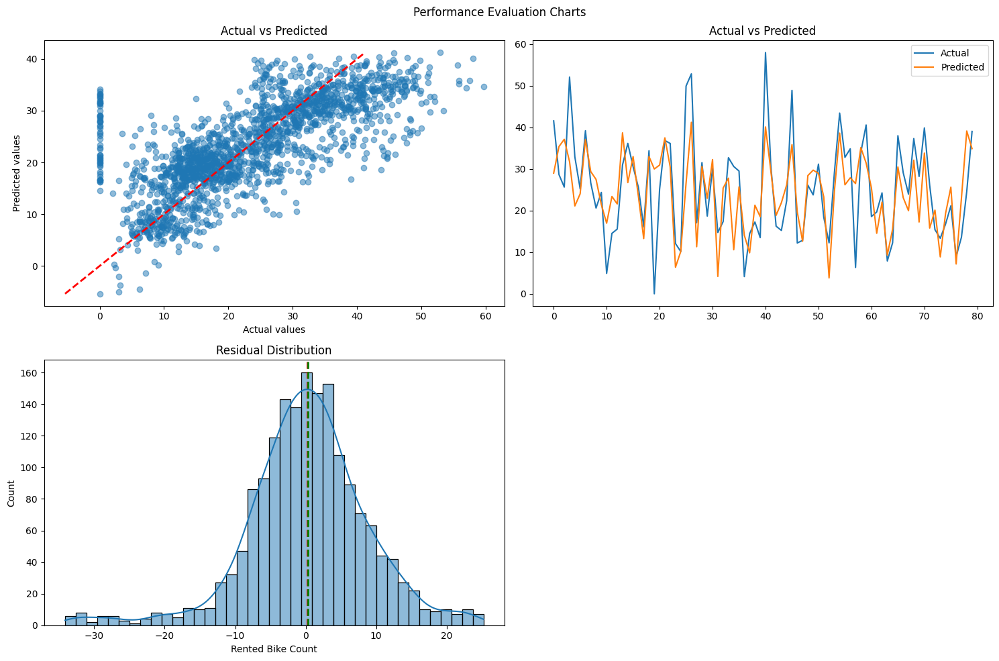

In [138]:
plot_graph(grid_search)

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

From above results we can see that there is no improvement in the performance matrics

In [139]:
#lets create a function for hyperparameter tunning of model and cross validation
def hyperparameter_tunning(model,param_space):
    x = GridSearchCV(estimator=model, param_grid = param_space, cv=5)
    x.fit(X_train, y_train)
    print("Best parameters (Grid Search):", x.best_params_)
    print("Best score (Grid Search):", x.best_score_)
    y_pred_test_cv = x.predict(X_test)
    y_pred_train_cv = x.predict(X_train)

    #get training evaluation matrics
    print(f'Training evaluation matrics for hyperparameter tunning of model')
    print("MSE (Grid Search):", mean_squared_error(y_train, y_pred_train_cv))
    print("RMSE (Grid Search):", np.sqrt(mean_squared_error(y_train, y_pred_train_cv)))
    print("MAE (Grid Search):", mean_absolute_error(y_train, y_pred_train_cv))
    print("R^2 score (Grid Search):", r2_score(y_train, y_pred_train_cv))
    print('Adj_R2 :',1-(1-r2_score(y_train, y_pred_train_cv))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)))

    #get testing evaluation matrics
    print(f'Tesing evaluation matrics for hyperparameter tunning of model')
    print("MSE (Grid Search):", mean_squared_error(y_test, y_pred_test_cv))
    print("RMSE (Grid Search):", np.sqrt(mean_squared_error(y_test, y_pred_test_cv)))
    print("MAE (Grid Search):", mean_absolute_error(y_test, y_pred_test_cv))
    print("R^2 score (Grid Search):", r2_score(y_test, y_pred_test_cv))
    print('Adj_R2 :',1-(1-r2_score(y_test, y_pred_test_cv))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))





In [140]:
parameters_linear = {'fit_intercept': [True, False],
              'copy_X': [True, False],
              'n_jobs': [1, -1],
              'positive': [True, False]}


In [141]:
hyperparameter_tunning(linear_regression,parameters_linear)

Best parameters (Grid Search): {'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': False}
Best score (Grid Search): 0.5070102434934307
Training evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 76.32193960696168
RMSE (Grid Search): 8.73624287705886
MAE (Grid Search): 6.3628242118969816
R^2 score (Grid Search): 0.5084960683266516
Adj_R2 : 0.5076528878863257
Tesing evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 74.49111150180424
RMSE (Grid Search): 8.630823338581566
MAE (Grid Search): 6.312321752205766
R^2 score (Grid Search): 0.5160293558153088
Adj_R2 : 0.5126897078968405


### ML Model - 2 : Lasso regularization model

In [142]:

'''def ml_model(model,X_train, X_test, y_train, y_test):
    # Initialize and train the linear regression model
    model = model
    model.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    # Evaluate training model evaluation matrics
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse)
    mae_train = mean_absolute_error(y_train, y_pred_train)
    r2_train = r2_score(y_train, y_pred_train)

    # Calculate adjusted R-squared
    n = len(X_train)
    p = X_train.shape[1]
    adj_r2_train = 1 - (1 - r2_train) * (n - 1) / (n - p - 1)

    # Evaluate testing model evaluation matrics
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse)
    mae_test = mean_absolute_error(y_test, y_pred_test)
    r2_test = r2_score(y_test, y_pred_test)

    print(f"Mean Squared Error (MSE): {mse_train}")
    print(f"Root Mean Squared Error (RMSE): {rmse_train}")
    print(f"Mean Absolute Error (MAE): {mae_train}")
    print(f"R-squared (R2): {r2_train}")
    print(f"Adjusted R-squared (Adjusted R2): {adj_r2_train}")

    print(f"Mean Squared Error (MSE): {mse_test}")
    print(f"Root Mean Squared Error (RMSE): {rmse_test}")
    print(f"Mean Absolute Error (MAE): {mae_test}")
    print(f"R-squared (R2): {r2_test}")
    print(f"Adjusted R-squared (Adjusted R2): {adj_r2_test}")

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 5))
    plt.scatter(y_test, y_pred_test)
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title("Actual vs. Predicted Values")
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--') # Add diagonal line
    plt.show()

    return model #return the model

    #Plotting Graph of observed vs predicted values
    plt.figure(figsize=(12,5))
    plt.plot((y_pred_test)[:80])
    plt.plot((np.array(y_test)[:80]))
    plt.legend(["Predicted","Actual"])
    # plt.xlabel('Data Point Index')
    # plt.ylabel('Value')
    plt.title('Predicted vs Actual Values')
    # plt.legend()
    plt.grid(True)
    plt.show()

    # Residuals of the regression are normally distributed. mean of residue should be zero or close to zero as much as possible.
    residue_linear = y_test - y_pred_test
    plt.figure(figsize=(12,5))
    sns.distplot(residue_linear)
    plt.title("Residual Distribution")
    plt.axvline(residue_linear.mean(), color='red', linestyle='dashed', linewidth=2)
    plt.axvline(residue_linear.median(), color='green', linestyle='dashed', linewidth=2)
    plt.show()'''

'def ml_model(model,X_train, X_test, y_train, y_test):\n    # Initialize and train the linear regression model\n    model = model\n    model.fit(X_train, y_train)\n\n    # Make predictions on the test set\n    y_pred_train = model.predict(X_train)\n    y_pred_test = model.predict(X_test)\n\n    # Evaluate training model evaluation matrics\n    mse_train = mean_squared_error(y_train, y_pred_train)\n    rmse_train = np.sqrt(mse)\n    mae_train = mean_absolute_error(y_train, y_pred_train)\n    r2_train = r2_score(y_train, y_pred_train)\n\n    # Calculate adjusted R-squared\n    n = len(X_train)\n    p = X_train.shape[1]\n    adj_r2_train = 1 - (1 - r2_train) * (n - 1) / (n - p - 1)\n\n    # Evaluate testing model evaluation matrics\n    mse_test = mean_squared_error(y_test, y_pred_test)\n    rmse_test = np.sqrt(mse)\n    mae_test = mean_absolute_error(y_test, y_pred_test)\n    r2_test = r2_score(y_test, y_pred_test)\n\n    print(f"Mean Squared Error (MSE): {mse_train}")\n    print(f"Root 

In [143]:
# ML Model - 2 Implementation
from sklearn.linear_model import Lasso
lasso = Lasso(alpha = 0.001, max_iter=10000)
lasso.fit(X_train,y_train)

# Predict on the model
y_pred_train_lasso = lasso.predict(X_train)   #----- will get predicted value of y_train
y_pred_test_lasso = lasso.predict(X_test)     #------ Will get the predicted value of y_test

In [144]:
lasso.score(X_train,y_train)

0.5084959919504073

In [145]:
lasso.coef_

array([ 3.78413892,  4.12725823, -2.37549292, -0.10029911,  0.05349043,
        0.28730551, -2.48780278,  0.10512896, -0.24963017,  0.64046764,
       -2.85045734, -0.39909764])

In [146]:
lasso.intercept_

23.44110442713799

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [147]:
#training accuracy of lasso model
training_evaluation_matrics(lasso)

MSE : 76.3220
RMSE : 8.7362
MAE : 6.3629
R² : 0.5085
Adjusted R² : 0.5077


In [148]:
# testing accuracy of lasso model
testing_evaluation_matrics(lasso)

MSE : 74.4912
RMSE : 8.6308
MAE : 6.3124
R² : 0.5160
Adjusted R² : 0.5127


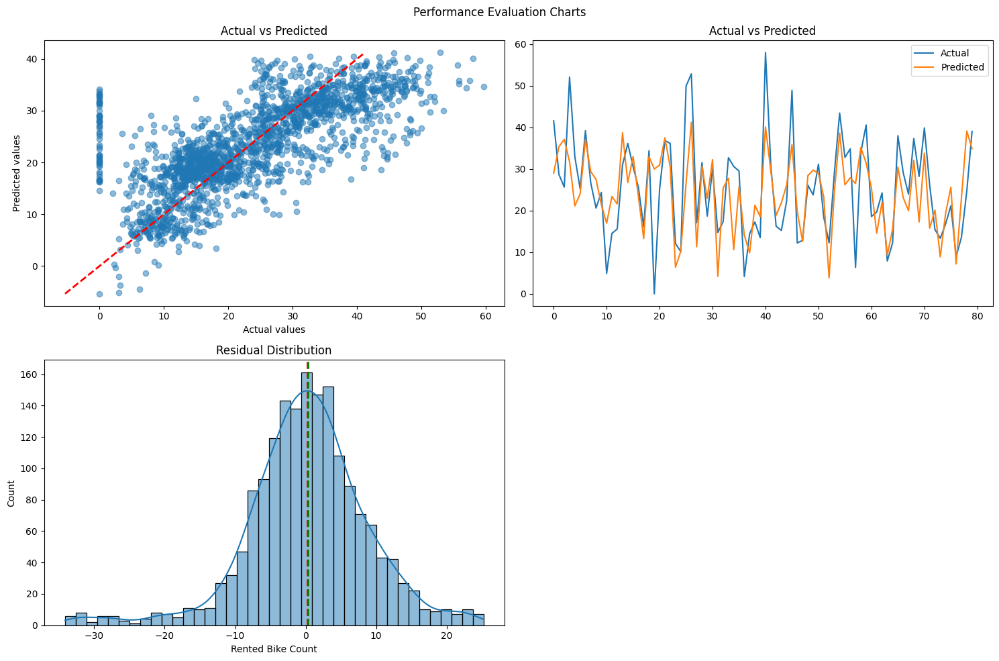

In [149]:
plot_graph(lasso)

#### 2. Cross- Validation & Hyperparameter Tuning

In [150]:
# ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
parameters_lasso = {'alpha': [0.001, 0.01, 0.1, 1, 2, 10, 50, 100]}
hyperparameter_tunning(lasso,parameters_lasso)


Best parameters (Grid Search): {'alpha': 0.01}
Best score (Grid Search): 0.5070294817743557
Training evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 76.32312491687162
RMSE (Grid Search): 8.736310715449148
MAE (Grid Search): 6.363485007077005
R^2 score (Grid Search): 0.5084884350761867
Adj_R2 : 0.5076452415409349
Tesing evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 74.49348585028235
RMSE (Grid Search): 8.630960888005596
MAE (Grid Search): 6.312752609490639
R^2 score (Grid Search): 0.5160139296129163
Adj_R2 : 0.5126741752456678


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

If we don't have very large hyperparameter space and training time for the model is not too long then we can go for this technique to find best hyperparameters.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridSearchCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

According to result we can't see any improvement

### ML Model - 3 : Ridge regularization model

In [151]:
# ML Model - 3 Implementation
from sklearn.linear_model import Ridge
ridge = Ridge(alpha = 0.001, max_iter=10000)

# Fit the Algorithm
ridge.fit(X_train,y_train)

# Predict on the model
y_pred_train_ridge = ridge.predict(X_train)
y_pred_test_ridge = ridge.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [152]:
ridge.score(X_train,y_train)

0.5084960683266423

In [153]:
ridge.intercept_

23.44110442713799

In [154]:
ridge.coef_

array([ 3.7853512 ,  4.12595909, -2.37696249, -0.10209652,  0.05344953,
        0.28809138, -2.48845355,  0.10668654, -0.25083836,  0.64135232,
       -2.85304091, -0.40008779])

In [155]:
#Training evaluation matrics
training_evaluation_matrics(ridge)

MSE : 76.3219
RMSE : 8.7362
MAE : 6.3628
R² : 0.5085
Adjusted R² : 0.5077


In [156]:
# testing evaluation matrics
testing_evaluation_matrics(ridge)

MSE : 74.4911
RMSE : 8.6308
MAE : 6.3123
R² : 0.5160
Adjusted R² : 0.5127


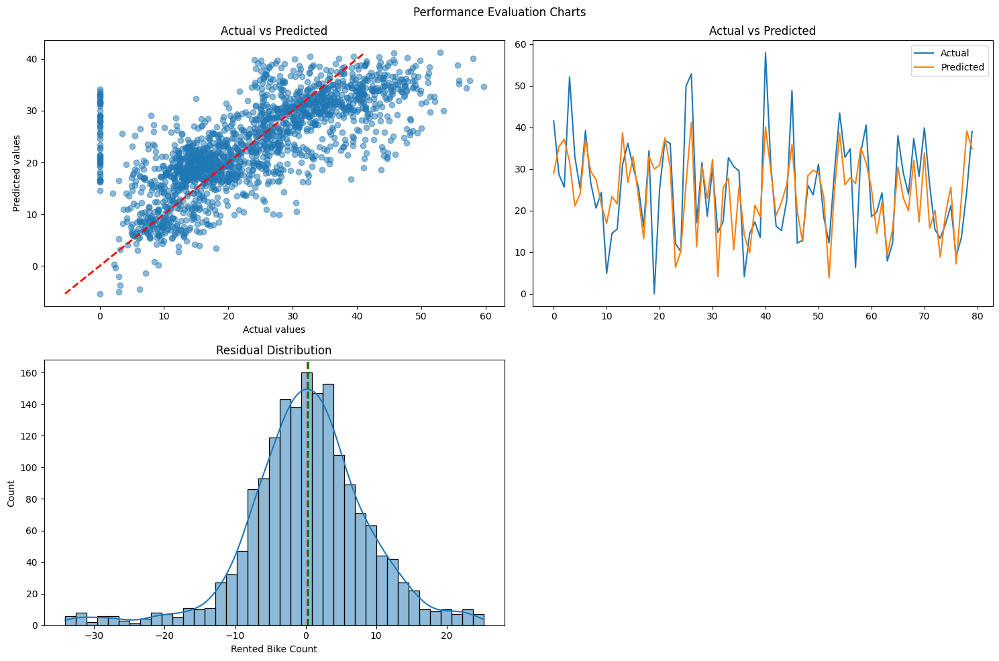

In [157]:
# Visualizing evaluation Metric Score chart
plot_graph(ridge)

#### 2. Cross- Validation & Hyperparameter Tuning

In [158]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
parameters_ridge = {'alpha': [0.001, 0.01, 0.1, 1, 2, 5, 10, 50, 100]}
hyperparameter_tunning(ridge,parameters_ridge)

Best parameters (Grid Search): {'alpha': 10}
Best score (Grid Search): 0.5070159450718195
Training evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 76.32208244002098
RMSE (Grid Search): 8.736251051796817
MAE (Grid Search): 6.363613243597322
R^2 score (Grid Search): 0.5084951484992654
Adj_R2 : 0.5076519664809653
Tesing evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 74.49200968955982
RMSE (Grid Search): 8.630875372148518
MAE (Grid Search): 6.3130044571057295
R^2 score (Grid Search): 0.5160235202666386
Adj_R2 : 0.5126838320798643


##### Which hyperparameter optimization technique have you used and why?

We have used GridSearchCV hyperparameter tuning technique

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

According to result we can't see any improvement

###ML Model - 4 : Decision tree regressor

In [159]:
#Import model
from sklearn.tree import DecisionTreeRegressor
#fit model
decision_tree_regressor = DecisionTreeRegressor(max_depth=8, min_samples_split=5, max_leaf_nodes=100, min_samples_leaf = 3 , random_state=0)
#train model
decision_tree_regressor.fit(X_train,y_train)
#predict the result
y_pred_train_decision_tree = decision_tree_regressor.predict(X_train)
y_pred_test_decision_tree = decision_tree_regressor.predict(X_test)


In [160]:
decision_tree_regressor.score(X_train,y_train)

0.7249089869869547

In [161]:
decision_tree_regressor.criterion

'squared_error'

In [162]:
#Training result
training_evaluation_matrics(decision_tree_regressor)


MSE : 42.7168
RMSE : 6.5358
MAE : 4.0611
R² : 0.7249
Adjusted R² : 0.7244


In [163]:
# Testing result
testing_evaluation_matrics(decision_tree_regressor)

MSE : 51.9685
RMSE : 7.2089
MAE : 4.4152
R² : 0.6624
Adjusted R² : 0.6600


Pruning: Consider pruning your decision tree to reduce its complexity and improve generalization.

Hyperparameter Tuning: Experiment with hyperparameters such as max_depth, min_samples_split, and min_samples_leaf to find a balance between bias and variance.

Cross-Validation: Use cross-validation techniques to better assess your model's performance across different subsets of your data.

Ensemble Methods: Consider using ensemble methods like Random Forests or Gradient Boosting, which can help mitigate overfitting while improving predictive performance.

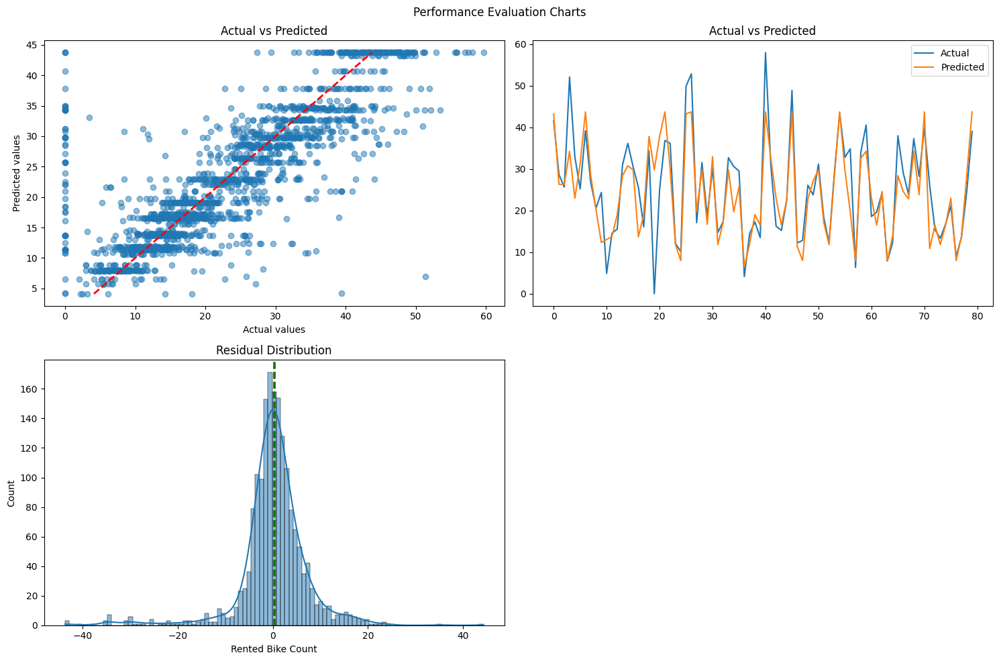

In [164]:
# plot a graph
plot_graph(decision_tree_regressor)

In [165]:
residue_dt = y_test - y_pred_test_decision_tree
print(f'mean of residue :' , residue_dt.mean())
print(f'median of residue :' , residue_dt.median())

mean of residue : 0.23813313691370513
median of residue : 0.28218078585744166


### Cross- Validation & Hyperparameter Tuning of decision tree regressor

In [166]:
parameters_dt = {'max_depth': np.arange(5,10),
          'min_samples_leaf' : [1,3,4,5,10],
          'max_leaf_nodes' : np.arange(70,110)
                 }

In [167]:
hyperparameter_tunning(decision_tree_regressor,parameters_dt)

Best parameters (Grid Search): {'max_depth': 9, 'max_leaf_nodes': 105, 'min_samples_leaf': 10}
Best score (Grid Search): 0.6608598740486
Training evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 41.96430553505868
RMSE (Grid Search): 6.477986225290903
MAE (Grid Search): 4.0809195911138785
R^2 score (Grid Search): 0.7297550184568208
Adj_R2 : 0.7292914101968468
Tesing evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 51.280778579639396
RMSE (Grid Search): 7.161059878233067
MAE (Grid Search): 4.439860527335333
R^2 score (Grid Search): 0.6668274785659566
Adj_R2 : 0.6645284157383495


The decision tree regressor's result shows that, in comparison to earlier models, the model is doing exceptionally well on both training and testing data.

## ML Model - 4 :  Random forest

In [168]:
# Import model
from sklearn.ensemble import RandomForestRegressor
# fit model
random_forest = RandomForestRegressor(random_state=42)
# train model
random_forest.fit(X_train,y_train)
# predict model
y_pred_train_random_forest = random_forest.predict(X_train)
y_pred_test_random_forest = random_forest.predict(X_test)

In [169]:
print(random_forest.score(X_train,y_train))
print(random_forest.score(X_test,y_test))

0.9647828674162885
0.7612366252444169


In [170]:
#training evaluation matrics
training_evaluation_matrics(random_forest)

MSE : 5.4686
RMSE : 2.3385
MAE : 1.2921
R² : 0.9648
Adjusted R² : 0.9647


In [171]:
# testing evaluation matrics
testing_evaluation_matrics(random_forest)

MSE : 36.7496
RMSE : 6.0621
MAE : 3.3554
R² : 0.7612
Adjusted R² : 0.7596


The high discrepancy between testing and training measures points to overfitting, a situation in which the model fails to generalise to new, unseen data despite learning noise and features from the training set.

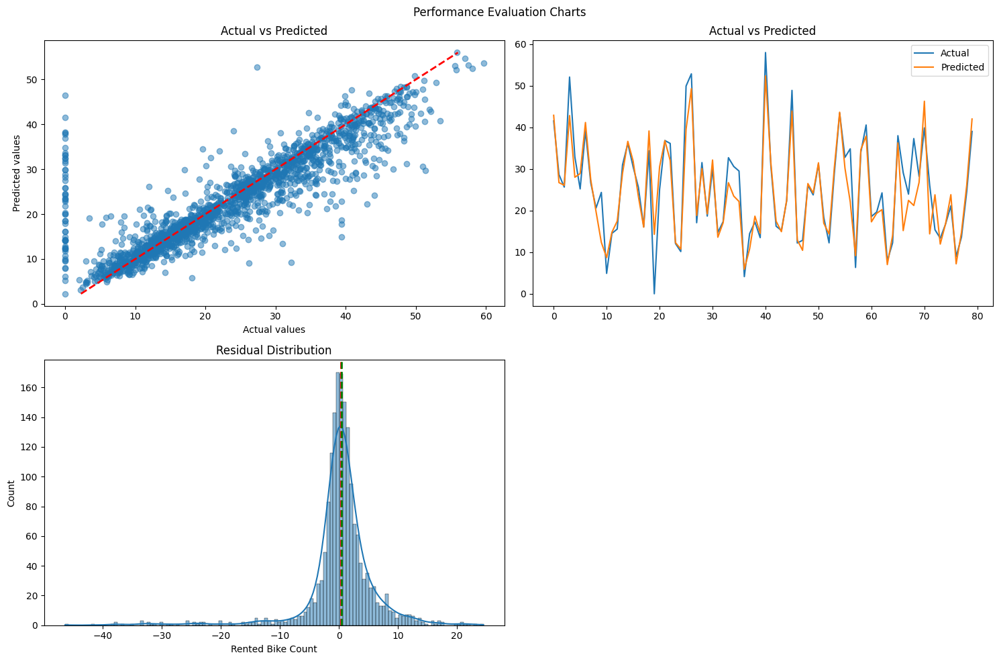

In [180]:
plot_graph(random_forest)

###Hyperparameter tunning:

In [172]:
param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2, 4]
}

hyperparameter_tunning(random_forest,param_grid_rf)

Best parameters (Grid Search): {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Best score (Grid Search): 0.7405821960351375
Training evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 10.106398828163195
RMSE (Grid Search): 3.1790562794897474
MAE (Grid Search): 1.6808229062245785
R^2 score (Grid Search): 0.9349160308990885
Adj_R2 : 0.9348043786290083
Tesing evaluation matrics for hyperparameter tunning of model
MSE (Grid Search): 36.38191557595255
RMSE (Grid Search): 6.031742333352159
MAE (Grid Search): 3.3313780160315427
R^2 score (Grid Search): 0.7636257700686836
Adj_R2 : 0.7619946655493186


ML Model - 5 : XG Boost

In [173]:
# Import model
from xgboost import XGBRegressor
# fit model
xgboost = XGBRegressor(learning_rate=0.01, n_estimators=1000, max_depth=5,random_state = 42)
# train model
xgboost.fit(X_train,y_train)
# predict model
y_pred_train_xgboost = xgboost.predict(X_train)
y_pred_test_xgboost = xgboost.predict(X_test)

In [174]:
xgboost.score(X_train,y_train)

0.8021316678642674

In [175]:
xgboost.score(X_test,y_test)

0.756245528615446

In [176]:
training_evaluation_matrics(xgboost)

MSE : 30.7255
RMSE : 5.5431
MAE : 3.1063
R² : 0.8021
Adjusted R² : 0.8018


In [177]:
testing_evaluation_matrics(xgboost)

MSE : 37.5179
RMSE : 6.1252
MAE : 3.4338
R² : 0.7562
Adjusted R² : 0.7546


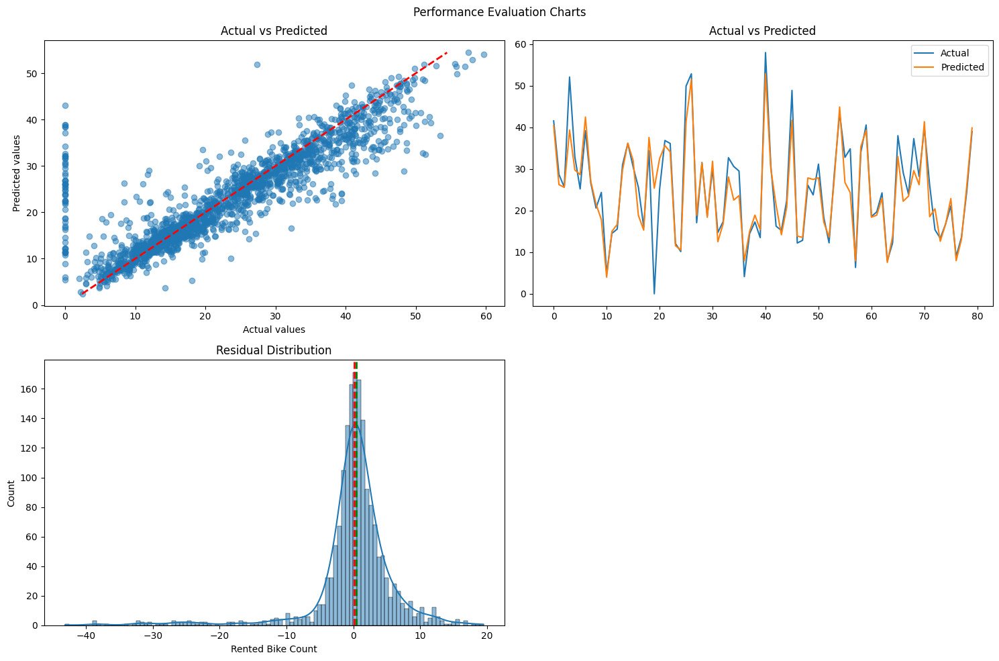

In [178]:
plot_graph(xgboost)

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

XG boost perform very well so we are selecting XG boost model.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

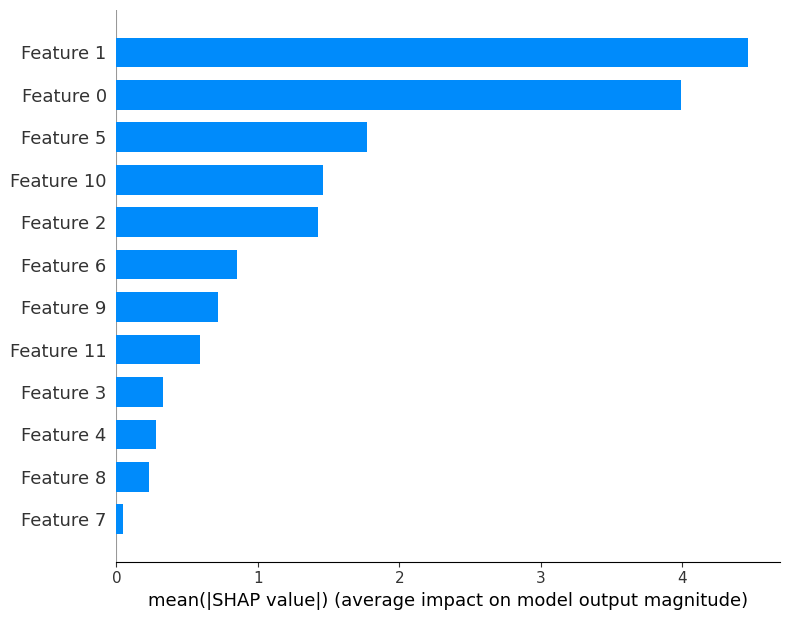

In [179]:
import shap
# Create a SHAP Explainer object
explainer = shap.Explainer(xgboost)

# Calculate SHAP values for all features
shap_values = explainer(X_test)

# Plot the feature importance using a bar plot
shap.summary_plot(shap_values, X_test, plot_type="bar")

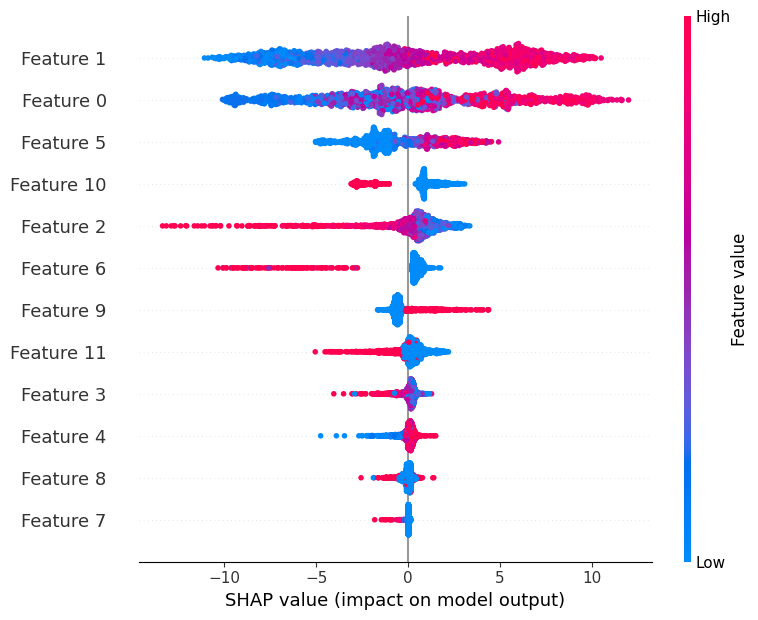

In [181]:
shap.summary_plot(shap_values, X_test)

Answer Here.

# **Conclusion**

####Here are some solution to increase Rental Bike Demands:

1. Marketing campaigns: Launch targeted marketing campaigns during seasons when

2. the demand for bike rentals is low, such as winter, to increase awareness and encourage people to rent bikes.
3. Seasonal pricing: Offer seasonal pricing strategies to encourage customers to rent bikes during low demand seasons.
4. Location-based pricing: Consider implementing dynamic pricing strategies based on the location of the bike rental stations. Higher demand locations can have higher pricing to ensure that bikes are available for customers in low demand locations.
5. Increasing visibility: Improving visibility of bike rental stations as well as installing lights on the bike can attract more customers even when visibility is low. Consider installing better signage, increasing lighting or even painting the stations in bright colours to increase their visibility.
6. Offering incentives: Offer incentives such as loyalty programs, discounts, and referral programs to encourage customers to rent bikes and refer friends to do the same.

Demand for bike rentals is highest during the summer months (May, June, July) and lowest during the winter months (December, January, February).

Demand is highest during rush hour, with a peak in the morning (8-10 am) and the evening (5-7 pm).

Temperature have a significant impact on demand, with demand increasing as the temperature increases up to a certain point (around 30°C for temperature).

Rainfall and snowfall have a negative impact on demand, with demand decreasing as the amount of rainfall or snowfall increases.

Demand is lower on holidays compared to non-holidays.

XGBoost model performed best for predicting bike rental demand.
training score is 80 percente and testing score is 76 percent.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***